# Anticipez les besoins en consommation de bâtiments
# Nettoyage des données

## Sommaire

* Importation des librairies et du jeu de données
* Signification des colonnes
* Nettoyage du jeu de données
    * Découverte des données
    * Nettoyage des données
        * Suppression des batiments résidentiels
        * Suppression des features non essentielles
        * Traitement des Nan
        * Traitement des doublons
* Exploration statistique
    * Statistiques
* Traitement des outliers
    * Prétraitement des index de colonnes
    * Traitement des variables négatives
        * Traitement de la feature 'Electricity_Kbtu'
        * Traitement de la feature 'TotalGHGEmissions'
        * Traitement de la feature 'GHGEmissionsIntensity'
    * Affichages des données maximum/minimum
* Feature Engineering
    * Traitement de la distribution des features
        * Affichage de la distribution avant retraitement
    * Traitement des features 'cibles' qui ont une distribution asymétrique
        * Traitement de la feature 'SiteEnergyUse_Kbtu'
        * Traitement de la feature 'SiteEUI_Kbtu_sf'
        * Traitement de la feature 'SourceEnergyUse_Kbtu'
    * Traitement des features qui ont une distribution asymétrique
        * Transformation Yeo-Johnson
        * Unités
* Création du dataframe du travail d'analyse exploratoire
* Vérification de la géolocalisation
* Analyse Exploratoire
    * Création de dataframe d'études :
    * Analyse univariée
        * Affichage des distributions
        * Affichage du graphique PairPlot
        * Table de corrélation
    * Analyse Bivariée
        * Représentation graphique de la corrélation de certaines features
        * ANOVA
        * CHI 2
* Analyse multivariée
    * Kmean
        * Préparation du jeu de données
        * Définition du nombre de clusters
        * Enregistrement des labels et des centroids
        * Mise à l'échelle des données et entrainement du modèle
        * Projection
        * Visualisation
    * PCA
        * Préparation du jeu de données
        * Data split
            * Séparation des données
        * Scaling
        * Composants
* Création des fichiers de sauvegarde


## Importation des librairies et du jeu de données

In [92]:
# Import des librairies
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import warnings
import folium
import moduleexplo
import plotly.express as px
import statsmodels.formula.api as smf
import statsmodels.api as sm
import scipy.stats as stats


from scipy.stats import chi2_contingency
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from yellowbrick.cluster import KElbowVisualizer, silhouette_visualizer, SilhouetteVisualizer

# Vérification des libairies installées
print('Verification de la mise à jour des librairies utilisées :')
print('Python: {}'.format(sys.version))
print('NumPy         : ' + np.version.full_version)
print('Pandas        : ' + pd.__version__)
print('Matplotlib    : ' + mpl.__version__)
print('Seaborn       : ' + sns.__version__)
print('sklearn       : ' + sklearn.__version__)
print('statsmodels   : ' + sm.__version__)

Verification de la mise à jour des librairies utilisées :
Python: 3.10.9 (main, Jan 11 2023, 09:18:20) [Clang 14.0.6 ]
NumPy         : 1.23.3
Pandas        : 1.5.3
Matplotlib    : 3.6.3
Seaborn       : 0.12.2
sklearn       : 1.2.1
statsmodels   : 0.13.5


In [93]:
#reglage de l'affichage de données
pd.set_option('display.max_row',250)
pd.set_option('display.max_column',300)
pd.set_option('display.precision', 5)

In [94]:
#Importation du jeu de données
data = pd.read_csv('2016_Building_Energy_Benchmarking.csv', decimal=".", index_col=0)

## Signification des colonnes

OSEBuildingID
A unique identifier assigned to each property covered by the Seattle Benchmarking Ordinance for tracking and identification purposes.

DataYear
Calendar year (January-December) represented by each data record.

BuildingType
City of Seattle building type classification.

PrimaryPropertyType
The primary use of a property (e.g. office, retail store). Primary use is defined as a function that accounts for more than 50% of a property. This is the Property Type - EPA Calculated field from Portfolio Manager.

PropertyName
Official or common property name as entered in EPA’s Portfolio Manager.

Address
Property street address

City
Property city

State
Property state

ZipCode
Property zip

TaxParcelIdentificationNumber
Property King County PIN

CouncilDistrictCode
Property City of Seattle council district.

Neighborhood
Property neighborhood area defined by the City of Seattle Department of Neighborhoods.

Latitude
Property latitude.

Longitude
Property longitude.

YearBuilt
Year in which a property was constructed or underwent a complete renovation.

NumberofBuildings
Number of buildings included in the property's report. In cases where a property is reporting as a campus, multiple buildings may be included in one report.

NumberofFloors
Number of floors reported in Portfolio Manager

PropertyGFATotal
Total building and parking gross floor area.

PropertyGFAParking
Total space in square feet of all types of parking (Fully Enclosed, Partially Enclosed, and Open).

PropertyGFABuilding(s)
Total floor space in square feet between the outside surfaces of a building’s enclosing walls. This includes all areas inside the building(s), such as tenant space, common areas, stairwells, basements, storage, etc.

ListOfAllPropertyUseTypes
All property uses reported in Portfolio Manager

LargestPropertyUseType
The largest use of a property (e.g. office, retail store) by GFA.

LargestPropertyUseTypeGFA
The gross floor area (GFA) of the largest use of the property.

SecondLargestPropertyUseType
The second largest use of a property (e.g. office, retail store) by GFA.

SecondLargestPropertyUseTypeGFA
The gross floor area (GFA) of the second largest use of the property.

ThirdLargestPropertyUseType
The third largest use of a property (e.g. office, retail store) by GFA.

ThirdLargestPropertyUseTypeGFA
The gross floor area (GFA) of the third largest use of the property.

YearsENERGYSTARCertified
Years the property has received ENERGY STAR certification.

ENERGYSTARScore
An EPA calculated 1-100 rating that assesses a property’s overall energy performance, based on national data to control for differences among climate, building uses, and operations. A score of 50 represents the national median.

SiteEUI(kBtu/sf)
Site Energy Use Intensity (EUI) is a property's Site Energy Use divided by its gross floor area. Site Energy Use is the annual amount of all the energy consumed by the property on-site, as reported on utility bills. Site EUI is measured in thousands of British thermal units (kBtu) per square foot.

SiteEUIWN(kBtu/sf)
Weather Normalized (WN) Site Energy Use Intensity (EUI) is a property's WN Site Energy divided by its gross floor area (in square feet). WN Site Energy is the Site Energy Use the property would have consumed during 30-year average weather conditions. WN Site EUI is measured in measured in thousands of British thermal units (kBtu) per square foot.

SourceEUI(kBtu/sf)
Source Energy Use Intensity (EUI) is a property's Source Energy Use divided by its gross floor area. Source Energy Use is the annual energy used to operate the property, including losses from generation, transmission, & distribution. Source EUI is measured in thousands of British thermal units (kBtu) per square foot.

SourceEUIWN(kBtu/sf)
Weather Normalized (WN) Source Energy Use Intensity (EUI) is a property's WN Source Energy divided by its gross floor area. WN Source Energy is the Source Energy Use the property would have consumed during 30-year average weather conditions. WN Source EUI is measured in measured in thousands of British thermal units (kBtu) per square foot.

SiteEnergyUse(kBtu)
The annual amount of energy consumed by the property from all sources of energy.

SiteEnergyUseWN(kBtu)
The annual amount of energy consumed by the property from all sources of energy, adjusted to what the property would have consumed during 30-year average weather conditions.

SteamUse(kBtu)
The annual amount of district steam consumed by the property on-site, measured in thousands of British thermal units (kBtu).

Electricity(kWh)
The annual amount of electricity consumed by the property on-site, including electricity purchased from the grid and generated by onsite renewable systems, measured in kWh.

Electricity(kBtu)
The annual amount of electricity consumed by the property on-site, including electricity purchased from the grid and generated by onsite renewable systems, measured in thousands of British thermal units (kBtu).

NaturalGas(therms)
The annual amount of utility-supplied natural gas consumed by the property, measured in therms.

NaturalGas(kBtu)
The annual amount of utility-supplied natural gas consumed by the property, measured in thousands of British thermal units (kBtu).

DefaultData
The property used default data for at least one property characteristic.

Comments
Comments by a building owner or agent to provide context to the building’s energy use.

ComplianceStatus
Whether a property has met energy benchmarking requirements for the current reporting year.

Outlier
Whether a property is a high or low outlier (Y/N)

TotalGHGEmissions
The total amount of greenhouse gas emissions, including carbon dioxide, methane, and nitrous oxide gases released into the atmosphere as a result of energy consumption at the property, measured in metric tons of carbon dioxide equivalent. This calculation uses a GHG emissions factor from Seattle CIty Light's portfolio of generating resources. This uses Seattle City Light's 2015 emissions factor of 52.44 lbs CO2e/MWh until the 2016 factor is available. Enwave steam factor = 170.17 lbs CO2e/MMBtu. Gas factor sourced from EPA Portfolio Manager = 53.11 kg CO2e/MBtu.

GHGEmissionsIntensity
Total Greenhouse Gas Emissions divided by property's gross floor area, measured in kilograms of carbon dioxide equivalent per square foot. This calculation uses a GHG emissions factor from Seattle City Light's portfolio of generating resources





## Nettoyage du jeu de données

### Découverte des données

In [95]:
# Forme du data set
data.shape

(3376, 45)

In [96]:
# On affiche les 5 premières lignes
data.head()

,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.7,84.3,182.50000,189.00000,7226362.5,7456910.0,2.00388e+06,1.15651e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.8,97.9,176.10001,179.39999,8387933.0,8664479.0,0.00000e+00,9.50425e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.0,97.7,241.89999,244.10001,72587024.0,73937112.0,2.15666e+07,1.45154e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.8,113.3,216.20000,224.00000,6794584.0,6946800.5,2.21445e+06,8.11525e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.8,118.7,211.39999,215.60001,14172606.0,14656503.0,0.00000e+00,1.57345e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [97]:
# On affiche les 5 dernières lignes
data.tail()

,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.10000,76.70000,161.70000,176.10001,8.49746e+05,9.43003e+05,0.0,153655.0000,5.24271e+05,3254.75024,3.25475e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.40000,65.90000,114.20000,118.90000,9.50276e+05,1.05371e+06,0.0,116221.0000,3.96546e+05,5537.29980,5.53730e+05,False,NaN,Compliant,NaN,32.17,2.01
50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,NaN,NaN,438.20001,460.10001,744.79999,767.79999,5.76590e+06,6.05376e+06,0.0,525251.6875,1.79216e+06,39737.39063,3.97374e+06,False,NaN,Compliant,NaN,223.54,16.99
50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,1,GREATER DUWAMISH,47.52832,-122.32431,1989,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,NaN,NaN,51.00000,55.50000,105.30000,110.80000,7.19471e+05,7.82841e+05,0.0,102248.0000,3.48870e+05,3706.01001,3.70601e+05,False,NaN,Compliant,NaN,22.11,1.57
50226,2016,Nonresidential COS,Mixed Use Property,Van Asselt Community Center,2820 S Myrtle St,Seattle,WA,NaN,7857002030,2,GREATER DUWAMISH,47.53939,-122.29536,1938,1.0,1,18258,0,18258,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,8271.0,Fitness Center/Health Club/Gym,8000.0,Pre-school/Daycare,1108.0,NaN,NaN,63.10000,70.90000,115.80000,123.90000,1.15290e+06,1.29372e+06,0.0,126774.3984,4.32554e+05,7203.41992,7.20342e+05,False,NaN,Compliant,NaN,41.27,2.26


In [98]:
#Description statistiques du dataset
data.describe()

,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,3376.0,3360.00000,3376.00000,3376.00000,3376.00000,3376.00000,3368.00000,3376.00000,3.37600e+03,3376.00000,3.37600e+03,3.35600e+03,1679.00000,596.00000,2533.00000,3369.00000,3370.00000,3367.00000,3367.00000,3.37100e+03,3.37000e+03,3.36700e+03,3.36700e+03,3.36700e+03,3.36700e+03,3.36700e+03,0.0,3367.00000,3367.00000
mean,2016.0,98116.94911,4.43928,47.62403,-122.33480,1968.57316,1.10689,4.70912,9.48335e+04,8001.52607,8.68320e+04,7.91776e+04,28444.07582,11738.67517,67.91867,54.73212,57.03380,134.23285,137.78393,5.40367e+06,5.27673e+06,2.74596e+05,1.08664e+06,3.70761e+06,1.36850e+04,1.36850e+06,NaN,119.72397,1.17592
std,0.0,18.61520,2.12063,0.04776,0.02720,33.08816,2.10840,5.49446,2.18838e+05,32326.72393,2.07940e+05,2.01703e+05,54392.91793,29331.19929,26.87327,56.27312,57.16333,139.28755,139.10981,2.16106e+07,1.59388e+07,3.91217e+06,4.35248e+06,1.48507e+07,6.70978e+04,6.70978e+06,NaN,538.83223,1.82145
min,2016.0,98006.00000,1.00000,47.49917,-122.41425,1900.00000,0.00000,0.00000,1.12850e+04,0.00000,3.63600e+03,5.65600e+03,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,-2.10000,0.00000e+00,0.00000e+00,0.00000e+00,-3.38268e+04,-1.15417e+05,0.00000e+00,0.00000e+00,NaN,-0.80000,-0.02000
25%,2016.0,98105.00000,3.00000,47.59986,-122.35066,1948.00000,1.00000,2.00000,2.84870e+04,0.00000,2.77560e+04,2.50948e+04,5000.00000,2239.00000,53.00000,27.90000,29.40000,74.70000,78.40000,9.25129e+05,9.70182e+05,0.00000e+00,1.87423e+05,6.39487e+05,0.00000e+00,0.00000e+00,NaN,9.49500,0.21000
50%,2016.0,98115.00000,4.00000,47.61867,-122.33249,1975.00000,1.00000,4.00000,4.41750e+04,0.00000,4.32160e+04,3.98940e+04,10664.00000,5043.00000,75.00000,38.60000,40.90000,96.20000,101.10000,1.80375e+06,1.90445e+06,0.00000e+00,3.45130e+05,1.17758e+06,3.23754e+03,3.23754e+05,NaN,33.92000,0.61000
75%,2016.0,98122.00000,7.00000,47.65712,-122.31941,1997.00000,1.00000,5.00000,9.09920e+04,0.00000,8.42762e+04,7.62002e+04,26640.00000,10138.75000,90.00000,60.40000,64.27500,143.89999,148.35000,4.22246e+06,4.38143e+06,0.00000e+00,8.29318e+05,2.82963e+06,1.18903e+04,1.18903e+06,NaN,93.94000,1.37000
max,2016.0,98272.00000,7.00000,47.73387,-122.22097,2015.00000,111.00000,99.00000,9.32016e+06,512608.00000,9.32016e+06,9.32016e+06,686750.00000,459748.00000,100.00000,834.40002,834.40002,2620.00000,2620.00000,8.73924e+08,4.71614e+08,1.34943e+08,1.92577e+08,6.57074e+08,2.97909e+06,2.97909e+08,NaN,16870.98000,34.09000


In [99]:
# Informations de remplissage et de type
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3376 entries, 1 to 50226
Data columns (total 45 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   DataYear                         3376 non-null   int64  
 1   BuildingType                     3376 non-null   object 
 2   PrimaryPropertyType              3376 non-null   object 
 3   PropertyName                     3376 non-null   object 
 4   Address                          3376 non-null   object 
 5   City                             3376 non-null   object 
 6   State                            3376 non-null   object 
 7   ZipCode                          3360 non-null   float64
 8   TaxParcelIdentificationNumber    3376 non-null   object 
 9   CouncilDistrictCode              3376 non-null   int64  
 10  Neighborhood                     3376 non-null   object 
 11  Latitude                         3376 non-null   float64
 12  Longitude          

In [100]:
# Titre des colonnes
data.columns

Index(['DataYear', 'BuildingType', 'PrimaryPropertyType', 'PropertyName',
       'Address', 'City', 'State', 'ZipCode', 'TaxParcelIdentificationNumber',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'YearsENERGYSTARCertified',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)',
       'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)',
       'DefaultData', 'Comments', 'ComplianceStatus', 'Outlier',
       'TotalGHGEmiss

In [101]:
# On crée une liste
data.columns.to_list

<bound method IndexOpsMixin.tolist of Index(['DataYear', 'BuildingType', 'PrimaryPropertyType', 'PropertyName',
       'Address', 'City', 'State', 'ZipCode', 'TaxParcelIdentificationNumber',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'YearsENERGYSTARCertified',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)',
       'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)',
       'DefaultData', 'Comments', 'ComplianceSta

Le nombre de lignes du fichier est de  3376 et de son nombre de colonnes est de 45


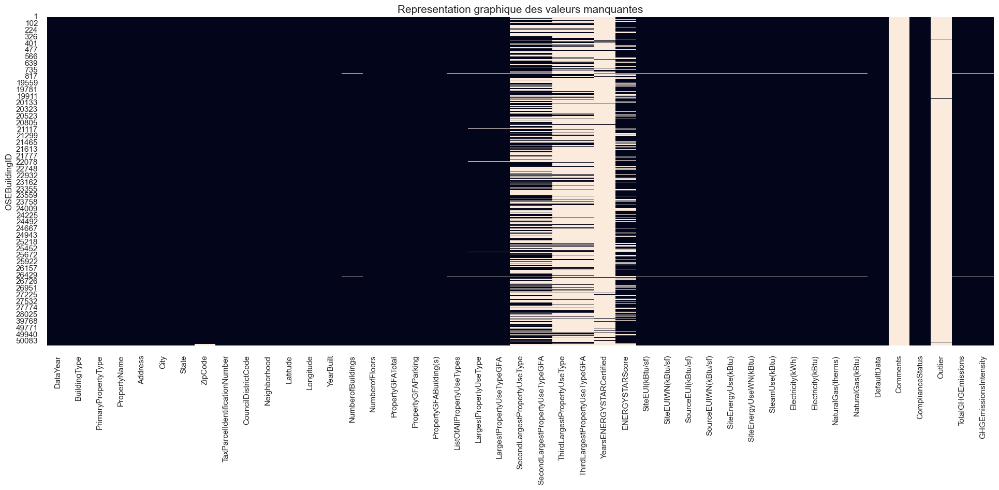

In [102]:
# Affichage des données vides (en blanc)
moduleexplo.valeurs(data)

In [103]:
#Affichage des colonnes pour lesquelles il manque des données
moduleexplo.manquant(data)

DataYear                              0
BuildingType                          0
PrimaryPropertyType                   0
PropertyName                          0
Address                               0
City                                  0
State                                 0
ZipCode                              16
TaxParcelIdentificationNumber         0
CouncilDistrictCode                   0
Neighborhood                          0
Latitude                              0
Longitude                             0
YearBuilt                             0
NumberofBuildings                     8
NumberofFloors                        0
PropertyGFATotal                      0
PropertyGFAParking                    0
PropertyGFABuilding(s)                0
ListOfAllPropertyUseTypes             9
LargestPropertyUseType               20
LargestPropertyUseTypeGFA            20
SecondLargestPropertyUseType       1697
SecondLargestPropertyUseTypeGFA    1697
ThirdLargestPropertyUseType        2780


In [104]:
#Statistique des manquantes
moduleexplo.donnees_manquantes(data)

Le jeu de données contient 19952 valeurs manquantes pour  151920 valeurs, soit 13.13 %


3376 produits
45 variables

Type des variables:
 float64    22
object     15
int64       7
bool        1
dtype: int64


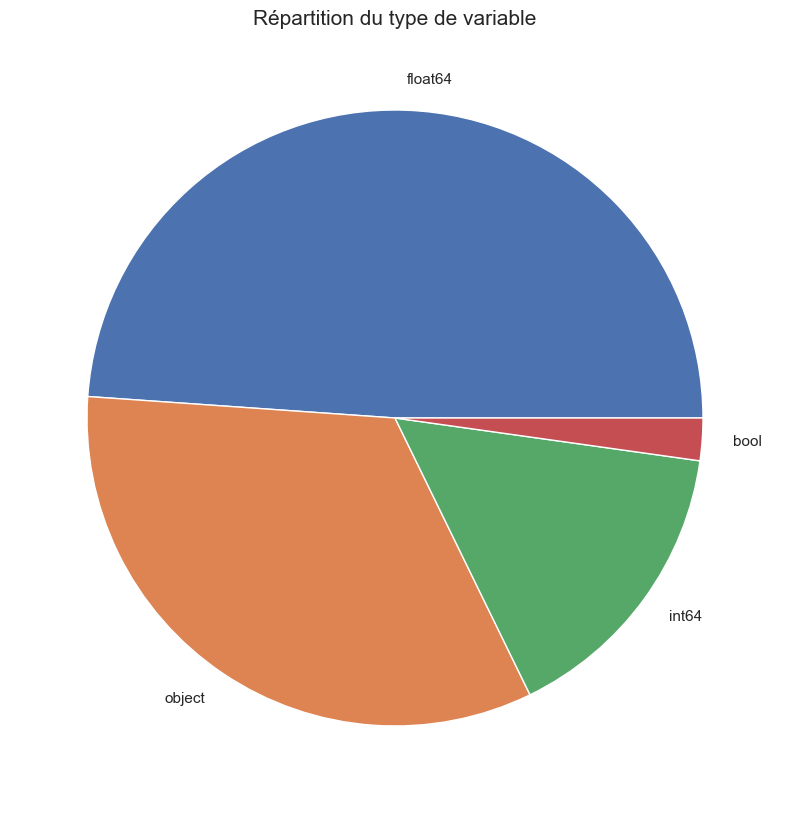

In [105]:
#On affiche le format des données
moduleexplo.format_data(data)

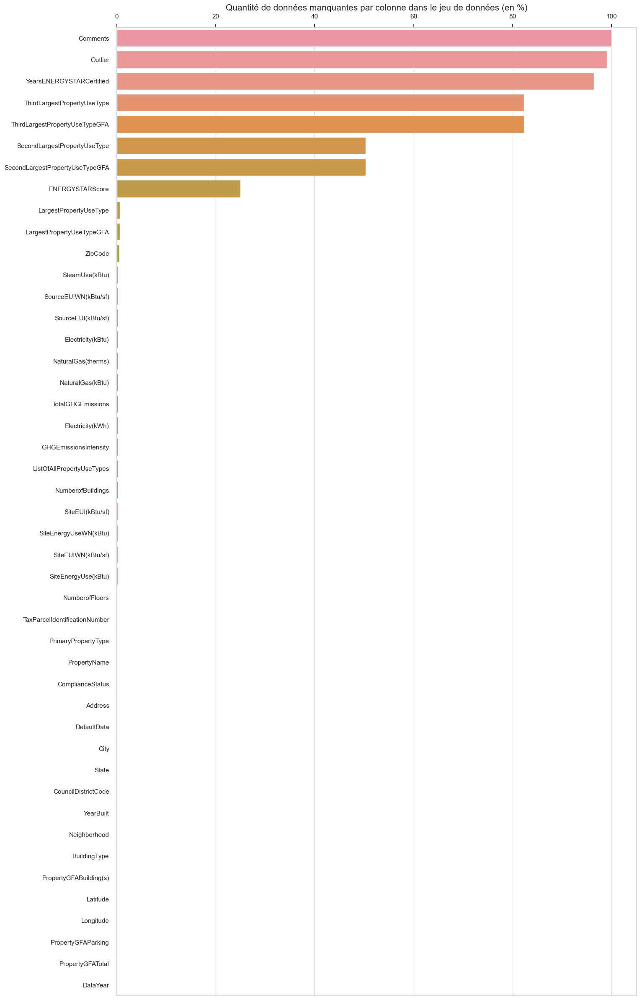

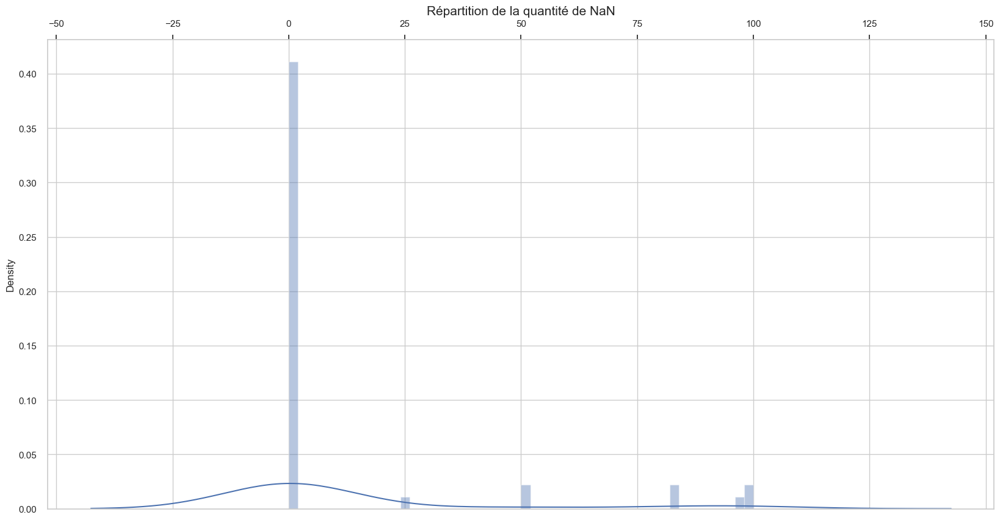

In [106]:
#On affiche la proportion de nan dans le fichier
moduleexplo.proportion_nan(data)

In [107]:
# Type de batiments
data['BuildingType'].value_counts()

NonResidential          1460
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
Multifamily HR (10+)     110
SPS-District K-12         98
Nonresidential COS        85
Campus                    24
Nonresidential WA          1
Name: BuildingType, dtype: int64

Dans ce travail, nous ne prenons en compte que les bâtiments non residentiels. Nous ecarterons donc les bâtiments intitulés "Multifamilly".
En revanche, nous concerverons les catégories "Other", "Mixed use property". Cette dernière catégorise les bâtiments d'habitation ayant une partie de leur surface affectée à une activité professionnelles.


### Nettoyage des données

#### Suppression des batiments résidentiels

In [108]:
pd.set_option('max_colwidth', None)
data_res = [row for row in data['BuildingType'] if ('Multifamily') in row]
data[data['BuildingType'].isin(data_res)]

,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
13,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Lyon Building,607 - 3rd Ave.,Seattle,WA,98104.0,0939000105,7,DOWNTOWN,47.60284,-122.33184,1910,1.0,6,63712,1496,62216,Multifamily Housing,Multifamily Housing,56132.0,NaN,NaN,NaN,NaN,NaN,1.0,81.5,85.6,182.70000,187.39999,4.57378e+06,4.80768e+06,1.03974e+06,7.42091e+05,2532015.0,10020.25977,1002026.0,False,NaN,Compliant,NaN,151.12,2.37
265,2016,Multifamily MR (5-9),Mid-Rise Multifamily,YWCA Opportunity Place,2024 3rd Avenue,Seattle,WA,98121.0,8729690000,7,DOWNTOWN,47.61316,-122.34153,2003,1.0,7,116947,0,116947,"Multifamily Housing, Office, Other - Lodging/Residential, Retail Store",Multifamily Housing,81740.0,Office,27403.0,Other - Lodging/Residential,12851.0,NaN,NaN,79.9,83.1,175.39999,178.80000,1.00401e+07,1.04427e+07,0.00000e+00,1.61273e+06,5502627.0,45374.94141,4537494.0,False,NaN,Compliant,NaN,279.35,2.39
280,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Wintonia,1431 Minor Ave,Seattle,WA,98101.0,8725600350,7,EAST,47.61360,-122.32785,1909,1.0,6,51976,0,51976,Multifamily Housing,Multifamily Housing,50350.0,NaN,NaN,NaN,NaN,NaN,34.0,83.2,89.0,156.80000,162.89999,4.18957e+06,4.48053e+06,0.00000e+00,4.90372e+05,1673151.0,25164.18750,2516419.0,False,NaN,Compliant,NaN,145.31,2.80
296,2016,Multifamily LR (1-4),Low-Rise Multifamily,Cooper School Artist's Lofts,4408 Delridge Way SW,Seattle,WA,98106.0,3388120000,1,DELRIDGE,47.56379,-122.36301,1917,1.0,4,56617,0,56617,Multifamily Housing,Multifamily Housing,56617.0,NaN,NaN,NaN,NaN,NaN,15.0,35.1,38.6,80.80000,88.40000,1.98661e+06,2.18555e+06,0.00000e+00,3.49326e+05,1191899.0,7947.11963,794712.0,False,NaN,Compliant,NaN,50.52,0.89
297,2016,Multifamily MR (5-9),Mid-Rise Multifamily,LAKE CITY COURT,12730 33RD AVE NE,Seattle,WA,98125.0,3993000000,5,NORTH,47.72232,-122.29181,2009,1.0,6,56745,0,56745,Multifamily Housing,Multifamily Housing,43673.0,NaN,NaN,NaN,NaN,NaN,54.0,56.6,59.0,133.89999,138.50000,2.47396e+06,2.57463e+06,0.00000e+00,4.55825e+05,1555274.0,9186.87988,918688.0,False,NaN,Compliant,NaN,59.63,1.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50090,2016,Multifamily MR (5-9),Mid-Rise Multifamily,131910 - LIV Seattle,4717 Brooklyn Ave NE,Seattle,WA,98105.0,8817400110,4,NORTHEAST,47.66366,-122.31450,2015,1.0,7,63825,4850,58975,Multifamily Housing,Multifamily Housing,71241.0,NaN,NaN,NaN,NaN,NaN,99.0,32.8,35.0,78.60000,85.40000,2.33765e+06,2.49328e+06,0.00000e+00,4.40775e+05,1503925.0,8337.25977,833726.0,False,NaN,Compliant,NaN,54.76,0.86
50092,2016,Multifamily MR (5-9),Residence Hall,Terry Hall & Maple Hall,1101 NE Campus Pkwy,Seattle,WA,98195.0,1142002345,4,NORTHEAST,47.65577,-122.31702,2015,1.0,7,325000,0,325000,Residence Hall/Dormitory,Residence Hall/Dormitory,325000.0,NaN,NaN,NaN,NaN,NaN,69.0,50.7,53.6,109.90000,113.00000,1.64675e+07,1.74301e+07,0.00000e+00,2.58341e+06,8814581.0,76529.03125,7652903.0,False,NaN,Compliant,NaN,467.90,1.44
50093,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Raven Terrace,820 Yesler Way,Seattle,WA,98104.0,9822000080,3,EAST,47.60

In [109]:
#Nettoyage des produits = à 'Low-Rise Multifamily'
products = data[data['PrimaryPropertyType']  == 'Low-Rise Multifamily' ].index
data.drop(products, axis = 0, inplace = True)

In [110]:
# Création d'un df ne contenant que les batiments non résidentiels
data_non_res = ['NonResidential',
                  'SPS-District K-12',
                  'Nonresidential COS'
                  'Campus',
                  'Nonresidential WA',
                  ]

In [111]:
#Drop des indicateurs non choisis
data = data[data['BuildingType'].isin(data_non_res)]
ng_lignes=data.shape[0]
print(f'Nombre de lignes restantes : {data.shape[0]}')

Nombre de lignes restantes : 1557


In [112]:
# Vérification du résultat
data['PrimaryPropertyType'].value_counts()

Small- and Mid-Sized Office    288
Other                          187
Warehouse                      180
Large Office                   168
K-12 School                    135
Mixed Use Property             102
Retail Store                    91
Hotel                           76
Worship Facility                71
Distribution Center             51
Supermarket / Grocery Store     40
Medical Office                  38
Self-Storage Facility           28
Residence Hall                  21
Senior Care Community           20
University                      18
Refrigerated Warehouse          12
Restaurant                      11
Hospital                        10
Laboratory                      10
Name: PrimaryPropertyType, dtype: int64

#### Suppression des features non essentielles

In [113]:
#Réduction du dataset en fonction des variables.
# Drop des data non essentielles
data = data.drop(['DataYear', 'State', 'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'ListOfAllPropertyUseTypes', 'Outlier', 'ComplianceStatus', 'Comments', 'DefaultData', 'NaturalGas(therms)', 'Electricity(kWh)', 'YearsENERGYSTARCertified', 'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',  'ZipCode', 'PropertyGFAParking', 'SiteEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)', 'SourceEUIWN(kBtu/sf)','BuildingType','City', 'LargestPropertyUseType' ], 1)

In [114]:
# Vérification du résultat
data.head(100)

,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,
1,Hotel,Mayflower park hotel,405 Olive way,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,88434,88434.0,60.0,81.70000,182.50000,7.22636e+06,2.00388e+06,3946027.0,1276453.0,249.98,2.83
2,Hotel,Paramount Hotel,724 Pine street,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,88502,83880.0,61.0,94.80000,176.10001,8.38793e+06,0.00000e+00,3242851.0,5145082.0,295.86,2.86
3,Hotel,5673-The Westin Seattle,1900 5th Avenue,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,759392,756493.0,43.0,96.00000,241.89999,7.25870e+07,2.15666e+07,49526664.0,1493800.0,2089.28,2.19
5,Hotel,HOTEL MAX,620 STEWART ST,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,61320,61320.0,56.0,110.80000,216.20000,6.79458e+06,2.21445e+06,2768924.0,1811213.0,286.43,4.67
8,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,113580,123445.0,75.0,114.80000,211.39999,1.41726e+07,0.00000e+00,5368607.0,8803998.0,505.01,2.88
10,Hotel,Camlin,1619 9th Avenue,DOWNTOWN,47.61390,-122.33283,1926,1.0,11,83008,83008,81352.0,27.0,70.80000,146.60001,5.75880e+06,0.00000e+00,2811215.0,2947580.0,176.14,2.12
11,Other,Paramount Theatre,911 Pine St,DOWNTOWN,47.61327,-122.33136,1926,1.0,8,102761,102761,102761.0,NaN,61.30000,141.70000,6.29813e+06,2.27629e+06,3636655.0,385189.0,221.51,2.16
12,Hotel,311wh-Pioneer Square,612 2nd Ave,DOWNTOWN,47.60294,-122.33263,1904,1.0,15,163984,163984,163984.0,43.0,83.70000,180.89999,1.37238e+07,0.00000e+00,7297919.0,6425900.0,392.16,2.39
15,Hotel,Hotel Monaco Seattle,1101 4th Avenue,DOWNTOWN,47.60695,-122.33414,1969,1.0,11,153163,133884,133884.0,30.0,119.60000,228.20000,1.60166e+07,5.23717e+06,6187627.0,4591850.0,691.26,4.51


#### Traitement des Nan

Le nombre de lignes du fichier est de  1557 et de son nombre de colonnes est de 21


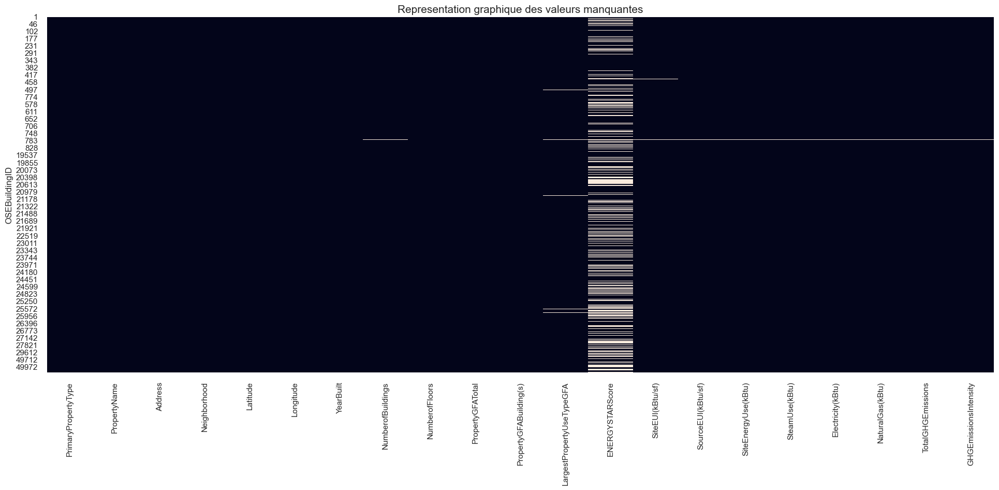

In [115]:
# Vérification des données manquantes
moduleexplo.valeurs(data)

In [116]:
# %age de manquants sur le df
moduleexplo.donnees_manquantes(data)

Le jeu de données contient 505 valeurs manquantes pour  32697 valeurs, soit 1.54 %


In [117]:
data = data.dropna()

In [118]:
# %age de manquants sur le df
moduleexplo.donnees_manquantes(data)

Le jeu de données contient 0 valeurs manquantes pour  22575 valeurs, soit 0.0 %


Elle ne contient pas de 0, nous pouvons donc continuer.

#### Traitement des doublons

In [119]:
#Recherche des doublons
data_doublons = data.duplicated().value_counts()

In [120]:
data_doublons

False    1075
dtype: int64

Il n'y pas de doublons dans le dataset

## Exploration statistique

In [121]:
colonnes = ["PropertyGFABuilding(s)",
         "SiteEUI(kBtu/sf)",
         "SourceEUI(kBtu/sf)",
         "SiteEnergyUse(kBtu)",
         "SteamUse(kBtu)",
         "Electricity(kBtu)",
         "NaturalGas(kBtu)",
         "TotalGHGEmissions",
         "GHGEmissionsIntensity",
         "ENERGYSTARScore",
         "NumberofFloors",
         "YearBuilt"]

#### Statistiques

In [122]:
# Affichage des statistiques descriptives du jeu de données
moduleexplo.stat_descriptives(data, colonnes)

Nous observons une forte variance pour les features 'LargestPropertyUseTypeGFA', 'SiteEnergyUse', 'SteamUse(KBTU)', Electricity(kBtu) et 'NaturalGas(Kbtu).
Nous avons aussi la présence de valeur négatives. Il est important de vérifier si se sont des données aberrantes ou des outliers, ou bien des données normales.
Il y a des valeurs négatives, mais il se peut que ce soit des batiments à énergie passive.
Le Bullitt center a été considéré comme le batiment le plus vert au monde. Il produit 784982 Kbtu par an, soit 230 000 kwh, ses besoins étaient de 147600 kwh en 2014.
Nous supprimerons cette valeur, car elle est une exception dans notre étude.

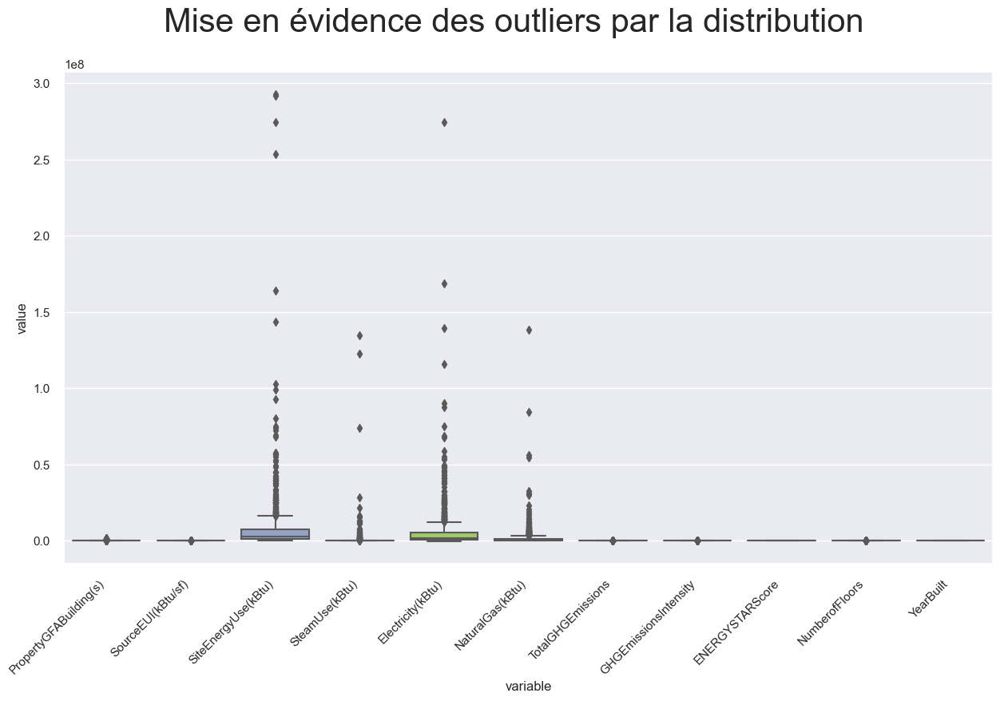

In [123]:
# Mise en évidence des outliers par la distribution
fig = plt.figure(figsize=(15,8))
fig.suptitle('Mise en évidence des outliers par la distribution',
             fontsize=30)

chart = sns.boxplot(
    data=pd.melt(data[["PropertyGFABuilding(s)",
                                "SourceEUI(kBtu/sf)",
                                "SiteEnergyUse(kBtu)",
                                "SteamUse(kBtu)",
                                "Electricity(kBtu)",
                                "NaturalGas(kBtu)",
                                "TotalGHGEmissions",
                                "GHGEmissionsIntensity",
                                "ENERGYSTARScore",
                                "NumberofFloors",
                                "YearBuilt"]]),
    x='variable',
    y='value',
    palette='Set2'
)

chart.set_xticklabels(chart.get_xticklabels(),
                      rotation=45,
                      horizontalalignment='right',
                      fontweight='light');

Nous observons la présence possible d’outliers sur les variables
LargestPropertyUseTypeGFA
Electricity(kWh)
TotalGHGEmissions
GHGEmissionsIntensity

## Traitement des outliers

#### Prétraitement des index de colonnes

In [124]:
# On remplace les '()' par des '_'
data.rename(columns={'PropertyGFABuilding(s)' : 'PropertyGFABuildings'}, inplace=True)
data.rename(columns={'SiteEUI(kBtu/sf)' : 'SiteEUI_kBtu_sf'}, inplace=True)
data.rename(columns={'SourceEUI(kBtu/sf)' : 'SourceEUI_kBtu_sf'}, inplace=True)
data.rename(columns={'SteamUse(kBtu)' : 'SteamUse_kBtu'}, inplace=True)
data.rename(columns={'Electricity(kBtu)' : 'Electricity_kBtu'}, inplace=True)
data.rename(columns={'NaturalGas(kBtu)' : 'NaturalGas_kBtu'}, inplace=True)
data.rename(columns={'SiteEnergyUse(kBtu)' : 'SiteEnergyUse_kBtu'}, inplace=True)

In [125]:
colonnes = ["PropertyGFABuildings",
            "SiteEUI_kBtu_sf",
            "SourceEUI_kBtu_sf",
            "SiteEnergyUse_kBtu",
            "SteamUse_kBtu",
            "Electricity_kBtu",
            "NaturalGas_kBtu",
            "TotalGHGEmissions",
            "GHGEmissionsIntensity",
            "ENERGYSTARScore",
            "NumberofFloors",
            "YearBuilt"]

### Traitement des variables négatives

#### Traitement de la feature 'Electricity_Kbtu'

In [126]:
data_clean = data.copy()

In [127]:
outliers_data = data_clean[data_clean['Electricity_kBtu'] < 0].index

In [128]:
data_clean.drop(outliers_data, axis = 0, inplace=True)

In [129]:
data_clean[data_clean['Electricity_kBtu'] < 0]

,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuildings,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI_kBtu_sf,SourceEUI_kBtu_sf,SiteEnergyUse_kBtu,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,


#### Traitement de la feature 'TotalGHGEmissions'

In [130]:
outliers_data = data_clean[data_clean['TotalGHGEmissions'] < 0].index

In [131]:
data_clean.drop(outliers_data, axis=0, inplace=True)

In [132]:
data_clean[data_clean['TotalGHGEmissions'] < 0]

,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuildings,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI_kBtu_sf,SourceEUI_kBtu_sf,SiteEnergyUse_kBtu,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,


#### Traitement de la feature 'GHGEmissionsIntensity'

In [133]:
outliers_data = data_clean[data_clean['GHGEmissionsIntensity'] < 0].index

In [134]:
data_clean.drop(outliers_data, axis=0, inplace=True)

In [135]:
data_clean[data_clean['GHGEmissionsIntensity'] < 0]

,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuildings,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI_kBtu_sf,SourceEUI_kBtu_sf,SiteEnergyUse_kBtu,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,


### Affichages des données maximum/minimum

In [136]:
#### Feature 'SiteEnergyUse_Kbtu'

In [137]:
data_clean.sort_values('SiteEnergyUse_kBtu', ascending=False)

,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuildings,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI_kBtu_sf,SourceEUI_kBtu_sf,SiteEnergyUse_kBtu,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,
276,Hospital,Harborview Medical Center,325 9th Ave.,EAST,47.60399,-122.32377,2000,9.0,8,1158691,1158691,1350182.0,29.0,217.10001,502.89999,2.93091e+08,1.22575e+08,1.68684e+08,1.83213e+06,10734.57,9.26
828,Hospital,Swedish First Hill,747 Broadway,EAST,47.60895,-122.32240,1994,7.0,14,1765970,1765970,1639334.0,54.0,177.89999,377.00000,2.91614e+08,1.34943e+08,1.39355e+08,1.73161e+07,12307.16,6.97
753,Other,WestinBuilding,2001 6th Ave,DOWNTOWN,47.61438,-122.33871,1981,1.0,33,429405,429405,218997.0,98.0,639.70001,2007.90002,2.74682e+08,0.00000e+00,2.74532e+08,1.49672e+05,1921.82,4.48
198,Hospital,Seattle Children's Hospital Main Campus,4800 Sand Point Way NE,NORTHEAST,47.66231,-122.28146,1953,6.0,10,879000,879000,879000.0,10.0,288.79999,578.20001,2.53832e+08,0.00000e+00,1.15641e+08,1.38191e+08,8145.52,9.27
49940,Hospital,Virginia Mason Medical Center - 2149,925 Seneca St.,EAST,47.60986,-122.32774,1920,1.0,8,374466,374466,1010135.0,74.0,162.30000,367.89999,1.63946e+08,7.38855e+07,9.00605e+07,0.00000e+00,6330.91,16.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23342,Warehouse,Daily Racing Form,12547 26th AVE NE,NORTH,47.72051,-122.30103,1977,1.0,1,21936,21936,21936.0,100.0,5.20000,12.30000,1.13130e+05,0.00000e+00,7.18270e+04,4.13030e+04,2.69,0.12
27007,Worship Facility,Seattle Community Church,4501 46th Avenue NE,NORTHEAST,47.66146,-122.27880,1954,1.0,2,20039,20039,20039.0,100.0,5.20000,16.40000,1.04722e+05,0.00000e+00,1.04722e+05,0.00000e+00,0.73,0.04
22830,Worship Facility,Freedom Church,9601 35th Ave,SOUTHWEST,47.51709,-122.37797,1971,1.0,1,23772,23772,23772.0,100.0,4.20000,13.30000,1.00842e+05,0.00000e+00,1.00842e+05,0.00000e+00,0.70,0.03


In [138]:
#### Feature 'PropertyGFATotal'

In [139]:
data_clean.sort_values('PropertyGFABuildings', ascending=False)

,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuildings,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI_kBtu_sf,SourceEUI_kBtu_sf,SiteEnergyUse_kBtu,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,
828,Hospital,Swedish First Hill,747 Broadway,EAST,47.60895,-122.32240,1994,7.0,14,1765970,1765970,1639334.0,54.0,177.89999,377.00000,2.91614e+08,1.34943e+08,1.39355e+08,17316120.0,12307.16,6.97
775,Large Office,Columbia Center - 2015,701 5th Avenue,DOWNTOWN,47.60454,-122.33072,1985,1.0,76,1952220,1632820,1680937.0,86.0,55.30000,167.30000,9.29376e+07,0.00000e+00,8.78519e+07,5085763.0,882.56,0.45
659,Large Office,Russell Investments Center,1301 2nd Ave,DOWNTOWN,47.60740,-122.33777,2005,1.0,42,1592914,1592914,914832.0,97.0,45.30000,140.00000,5.64989e+07,9.86403e+05,5.51239e+07,388532.0,481.06,0.30
640,Large Office,Starbucks Center,2401 Utah Ave South,GREATER DUWAMISH,47.58181,-122.33534,1912,0.0,6,1380959,1380959,1000730.0,79.0,49.30000,146.10001,7.41306e+07,0.00000e+00,6.77605e+07,6370020.0,810.70,0.59
345,Large Office,999 Third Avenue,"999 3rd Avenue, Suite 1550",DOWNTOWN,47.60505,-122.33427,1983,1.0,47,1323055,1323055,1011135.0,94.0,42.60000,133.50000,4.46837e+07,0.00000e+00,4.45218e+07,161812.0,318.97,0.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27587,Small- and Mid-Sized Office,Meridian Center Building,10303 Meridian Ave N,NORTHWEST,47.70349,-122.33424,1983,1.0,3,24696,18396,18396.0,87.0,33.90000,106.50000,6.24126e+05,0.00000e+00,6.24125e+05,0.0,4.35,0.18
21459,Mixed Use Property,Century,10 Harrison St.,MAGNOLIA / QUEEN ANNE,47.62230,-122.35653,1964,1.0,4,25132,17824,8061.0,41.0,55.60000,174.60001,5.64754e+05,0.00000e+00,5.64754e+05,0.0,3.94,0.16
24955,Distribution Center,3420/3430 E. Marginal Way Whse,3420/3430 E. Marginal Way,GREATER DUWAMISH,47.57227,-122.33843,1952,1.0,1,16300,16300,65164.0,100.0,2.30000,6.90000,1.50168e+05,0.00000e+00,1.38179e+05,11989.0,1.60,0.10


kBtu = kilo british termal unit
Il y a des valeurs négatives, mais il se peut que ce soit des batiments à énergie passive.
Le Bullitt center à été considéré comme le batiment le plus vert au monde. Il produit 784982 Kbtu par an, soit 230 000 kwh, ses besoins etaient de 147600 kwh en 2014.
Nous supprimons cette valeur, car elle est une exception dans notre etude.

Nous nous apercevons que les outliers n'en sont pas. La consommation électrique des hopitaux est très cohérente. Nous observons la présence d'un datacenter dans les 10 plus grosses consommations, ce qui n'est pas aberrant non plus. Nous prenons la decision de conserver ces données, malgré la forte variance. Nous constituerons un autre dataframe sans ces valeurs.


## Feature Engineering

### Traitement de la distribution des features

#### Affichage de la distibution avant retraitement

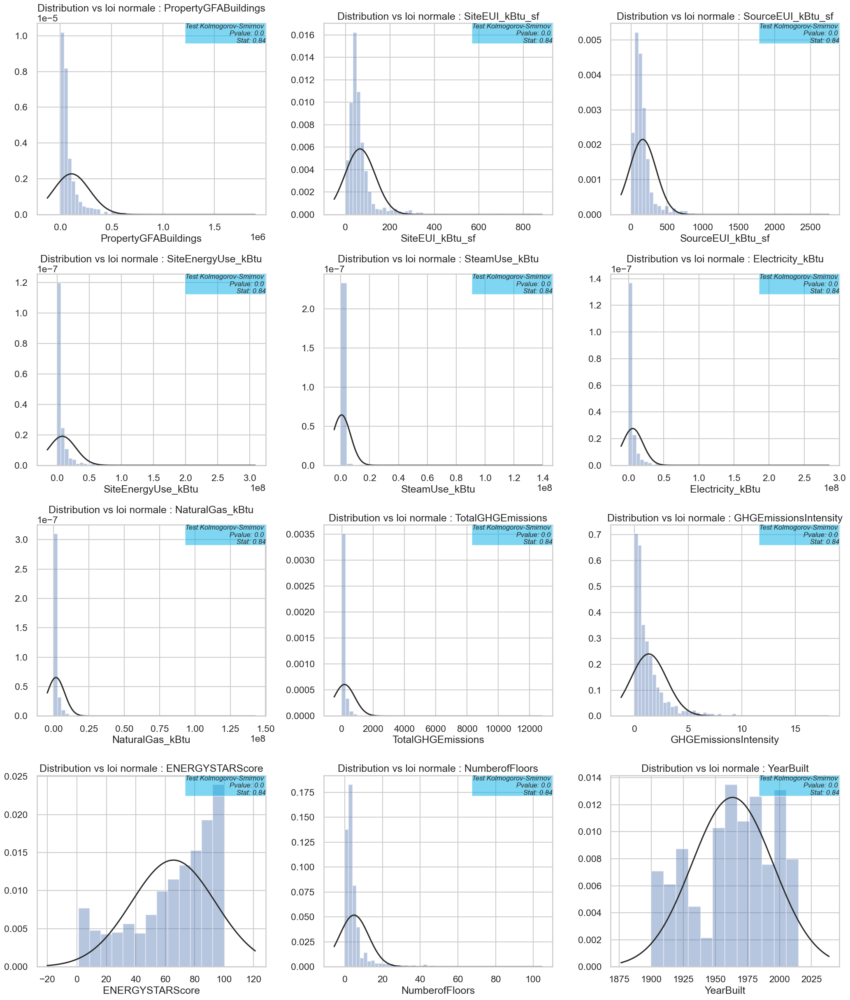

In [140]:
#Affichage de la distribution des features

warnings.filterwarnings('ignore')

sns.set_context("talk") # scaling automatique

sns.set_style("whitegrid")
fig = plt.figure(figsize=(21,30))

sub = 0
for i in range(len(colonnes)):
    fig.add_subplot(len(colonnes)//3+1,3,i+1)

    left, width = 0, 1
    bottom, height = 0, 1
    right = left + width
    top = bottom + height

    colonne = colonnes[i]
    kstest = stats.kstest(data[colonne].notnull(),'norm')
    ax = sns.distplot(data[colonne], fit=stats.norm, kde=False)
    ax.set_title("Distribution vs loi normale : {}".format(colonne))
    ax.text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue, kstest.statistic),
            horizontalalignment='right',
            verticalalignment='top',
            style='italic', transform=ax.transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})
    sub += 1

    fig.tight_layout()

plt.show()

Si skewness positif ==> courbe asymétrique, étalée à droite. Skewness > 1 donc on transformera la target en log.
Si kurtosis positif ==> courbe moins aplatie que la distribution normale avec des observations plus concentrées.

### Traitement des features 'cibles' qui ont une distribution asymétrique

Les variables cibles 'SiteEnergyUse_kBtu' et SiteEUI_kBtu_sf ne suivent pas une loi normale, ils sont asymétriques étalées à droite (skewness > 1) et moins aplaties que la distribution normale, rendons cette distribution plus normale en la transformant en logarithme. Nous les traitons à part car elles sont les features que nous utiliserons en tant que cible pour nos predictions. Le traitement logarithmique peut biaiser la modélisation ultérieur.

#### Traitement de la feature 'SiteEnergyUse_Kbtu'

In [141]:
# Test de transformation de la variable SiteEnergyUse en log1p, log2+1 et log10 +1
test_seu_1p = np.log1p(data['SiteEnergyUse_kBtu'])
test_seu_2p = np.log2(1+ data['SiteEnergyUse_kBtu'])
test_seu_10p = np.log10( 1+ data['SiteEnergyUse_kBtu'])

In [142]:
# Constitution du dataframe de travail
df_seu_test = pd.DataFrame(
    {'test1p': test_seu_1p, 'test2p': test_seu_2p, 'test10p': test_seu_10p})
df_seu_test

,test1p,test2p,test10p
OSEBuildingID,,,
1,15.79325,22.78484,6.85892
2,15.94230,22.99988,6.92366
3,18.10030,26.11321,7.86086
5,15.73164,22.69595,6.83216
8,16.46682,23.75660,7.15145
...,...,...,...
50045,16.45447,23.73878,7.14609
50062,15.61431,22.52669,6.78121
50068,15.09807,21.78191,6.55701


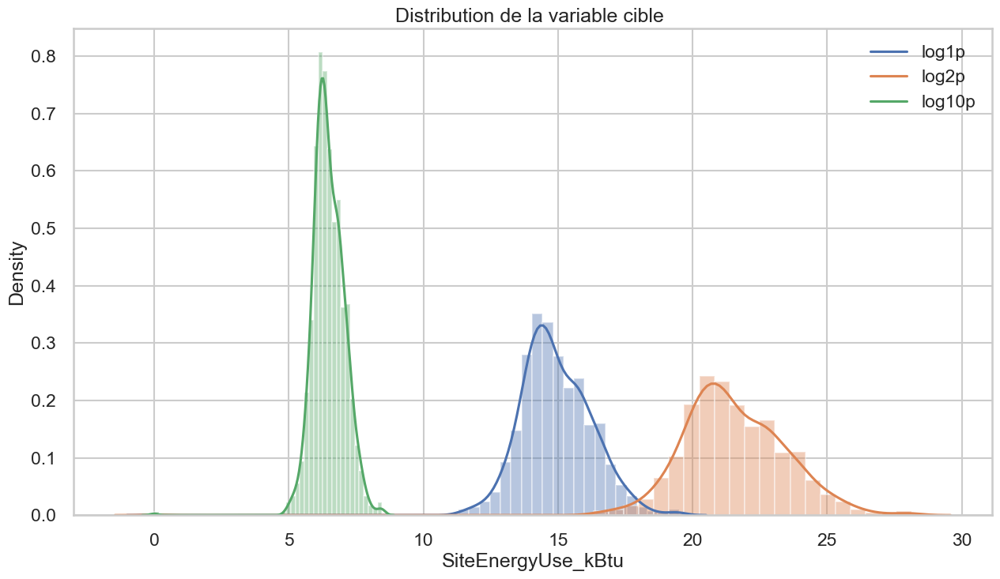

In [143]:
# Visualisation des 3 essais de transformation logarithmique
plt.figure(figsize=(15, 8))
plt.title('Distribution de la variable cible ')
sns.distplot(test_seu_1p)
sns.distplot(test_seu_2p)
sns.distplot(test_seu_10p)
ax = plt.gca()
ax.legend(['log1p', 'log2p', 'log10p'])
plt.show()

In [144]:
moduleexplo.stat_descriptives(df_seu_test, ['test1p', 'test2p', 'test10p'])

In [145]:
# Ajout d'une nouvelle variable 'SiteEnergyUse_kBtu'
data_clean['SiteEnergyUseLog'] = np.log1p(data['SiteEnergyUse_kBtu'])

#### Traitement de la feature 'SiteEUI_Kbtu_sf'

In [146]:
# Test de transformation de la variable SiteEUI_kBtu_sf en log1p, log2+1 et log10 +1
test_seui_1p = np.log1p(data['SiteEUI_kBtu_sf'])
test_seui_2p = np.log2(1+ data['SiteEUI_kBtu_sf'])
test_seui_10p = np.log10( 1+ data['SiteEUI_kBtu_sf'])

In [147]:
# Constitution du dataframe de travail
df_seui_test = pd.DataFrame(
    {'test1p': test_seui_1p, 'test2p': test_seui_2p, 'test10p': test_seui_10p})
df_seui_test

,test1p,test2p,test10p
OSEBuildingID,,,
1,4.41522,6.36982,1.91751
2,4.56226,6.58195,1.98137
3,4.57471,6.59991,1.98677
5,4.71671,6.80478,2.04844
8,4.75186,6.85549,2.06371
...,...,...,...
50045,3.73529,5.38888,1.62221
50062,4.24133,6.11894,1.84198
50068,4.25135,6.13340,1.84634


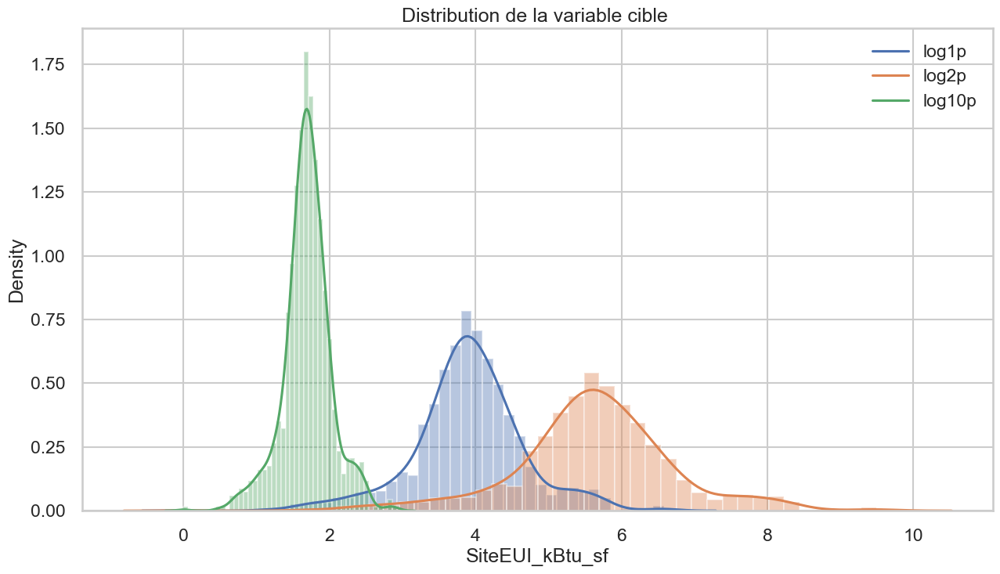

In [148]:
# Visualisation des 3 essais de transformation logarithmique
plt.figure(figsize=(15, 8))
plt.title('Distribution de la variable cible ')
sns.distplot(test_seui_1p)
sns.distplot(test_seui_2p)
sns.distplot(test_seui_10p)
ax = plt.gca()
ax.legend(['log1p', 'log2p', 'log10p'])
plt.show()

In [149]:
moduleexplo.stat_descriptives(df_seui_test, ['test1p', 'test2p', 'test10p'])

Desc,test1p,test2p,test10p
mean,3.903636,5.631756,1.695327
median,3.903991,5.632268,1.695482
var,0.578970,1.205050,0.109201
std,0.760901,1.097748,0.330455
skew,-0.231967,-0.231967,-0.231967
kurtosis,1.943663,1.943663,1.943663
mode,0 3.98341,0 5.74685,0 1.72997
Min,0.000000,0.000000,0.000000
Max,6.727911,9.706323,2.921894


In [150]:
# Ajout d'une nouvelle variable 'SiteEUI_kBtu_sf'
data_clean['SiteEUI_kBtu_sfLog'] = np.log1p(data['SiteEUI_kBtu_sf'])

#### Traitement de la feature 'SourceEnergyUse_Kbtu'

In [151]:
# Test de transformation de la variable SourceEUI_kBtu_sf en log1p, log2+1 et log10 +1
test_src_1p = np.log1p(data['SourceEUI_kBtu_sf'])
test_src_2p = np.log2(1 + data['SourceEUI_kBtu_sf'])
test_src_10p = np.log10(1 + data['SourceEUI_kBtu_sf'])

In [152]:
# Constitution du dataframe de travail
df_src_test = pd.DataFrame(
    {'test1p': test_src_1p, 'test2p': test_src_2p, 'test10p': test_src_10p})
df_src_test

,test1p,test2p,test10p
OSEBuildingID,,,
1,5.21221,7.51964,2.26364
2,5.17671,7.46842,2.24822
3,5.49265,7.92422,2.38543
5,5.38082,7.76288,2.33686
8,5.35847,7.73064,2.32715
...,...,...,...
50045,4.75014,6.85300,2.06296
50062,5.13874,7.41363,2.23172
50068,4.63570,6.68790,2.01326


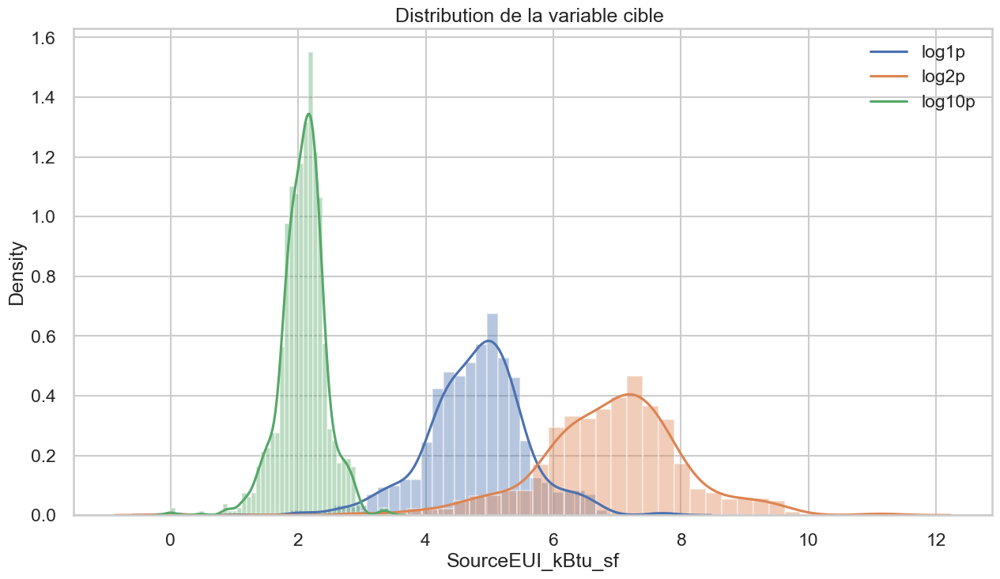

In [153]:
# Visualisation des 3 essais de transformation logarithmique
plt.figure(figsize=(15, 8))
plt.title('Distribution de la variable cible ')
sns.distplot(test_src_1p)
sns.distplot(test_src_2p)
sns.distplot(test_src_10p)
ax = plt.gca()
ax.legend(['log1p', 'log2p', 'log10p'])
plt.show()

In [154]:
moduleexplo.stat_descriptives(df_src_test, ['test1p', 'test2p', 'test10p'])

Desc,test1p,test2p,test10p
mean,4.786518,6.905486,2.078758
median,4.830711,6.969243,2.097951
var,0.660932,1.375644,0.124660
std,0.812978,1.172879,0.353072
skew,-0.534714,-0.534714,-0.534714
kurtosis,3.203301,3.203301,3.203301
mode,0 4.55493,0 6.57137,0 1.97818
Min,0.000000,0.000000,0.000000
Max,7.871311,11.355902,3.418467


In [155]:
# Ajout d'une nouvelle variable 'SourceEUI_kBtu_sf'
data_clean['SourceEUI_kBtu_sfLog'] = np.log1p(data['SourceEUI_kBtu_sf'])

Nous conservons les données initiales. Et nous ajoutons à celle-ci les données transformées.

### Traitement des features qui ont une distribution asymétrique

In [156]:
# Traitement algorithmiques des features non 'cibles"

In [157]:
data_clean.head()

,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFABuildings,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI_kBtu_sf,SourceEUI_kBtu_sf,SiteEnergyUse_kBtu,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity,SiteEnergyUseLog,SiteEUI_kBtu_sfLog,SourceEUI_kBtu_sfLog
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,,,,
1,Hotel,Mayflower park hotel,405 Olive way,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,88434,88434.0,60.0,81.7,182.50000,7226362.5,2.00388e+06,3946027.0,1276453.0,249.98,2.83,15.79325,4.41522,5.21221
2,Hotel,Paramount Hotel,724 Pine street,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,88502,83880.0,61.0,94.8,176.10001,8387933.0,0.00000e+00,3242851.0,5145082.0,295.86,2.86,15.94230,4.56226,5.17671
3,Hotel,5673-The Westin Seattle,1900 5th Avenue,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,759392,756493.0,43.0,96.0,241.89999,72587024.0,2.15666e+07,49526664.0,1493800.0,2089.28,2.19,18.10030,4.57471,5.49265
5,Hotel,HOTEL MAX,620 STEWART ST,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,61320,61320.0,56.0,110.8,216.20000,6794584.0,2.21445e+06,2768924.0,1811213.0,286.43,4.67,15.73164,4.71671,5.38082
8,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,113580,123445.0,75.0,114.8,211.39999,14172606.0,0.00000e+00,5368607.0,8803998.0,505.01,2.88,16.46682,4.75186,5.35847


In [158]:
# Création du Dataframe de travail
chiffres = data_clean[['PropertyGFABuildings', 'LargestPropertyUseTypeGFA', 'SteamUse_kBtu', 'Electricity_kBtu', 'NaturalGas_kBtu', 'TotalGHGEmissions', 'GHGEmissionsIntensity','YearBuilt', 'SiteEnergyUse_kBtu']]

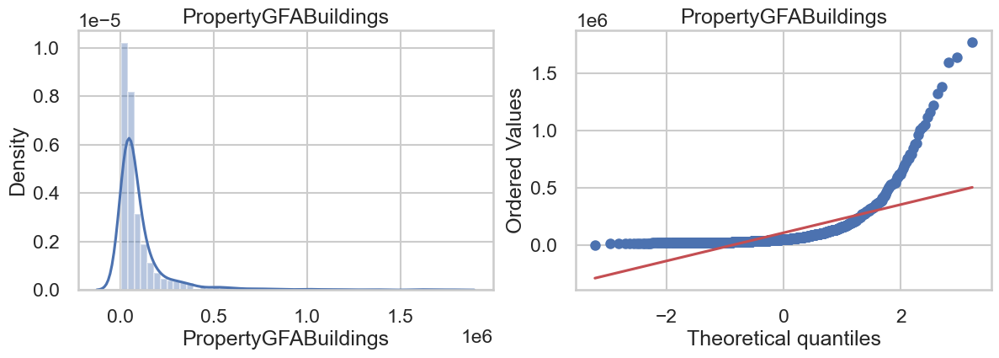

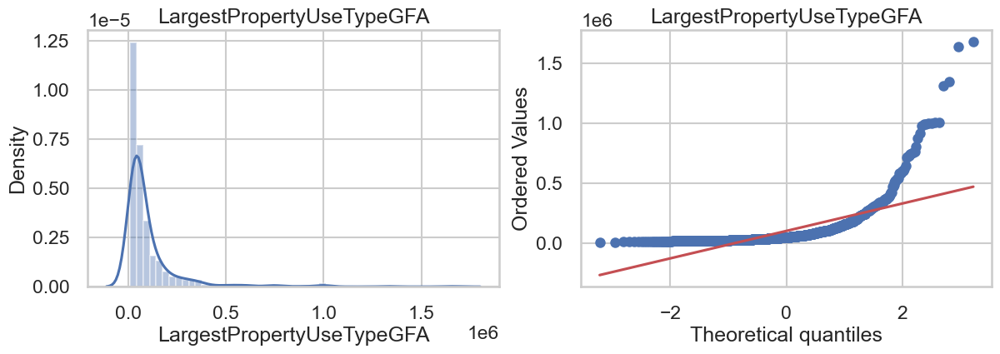

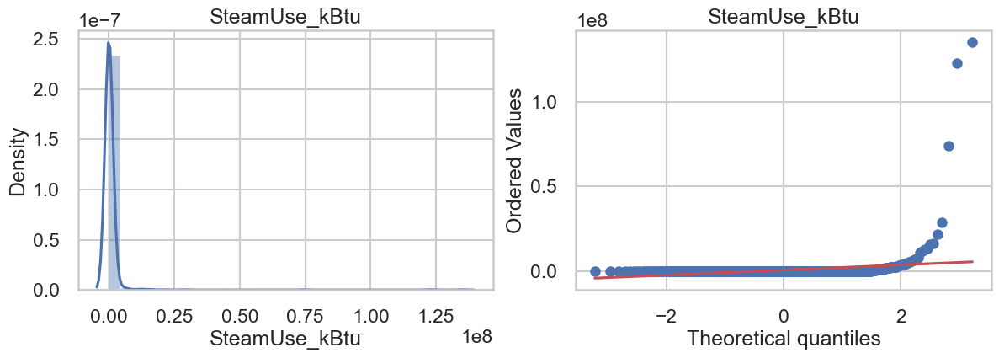

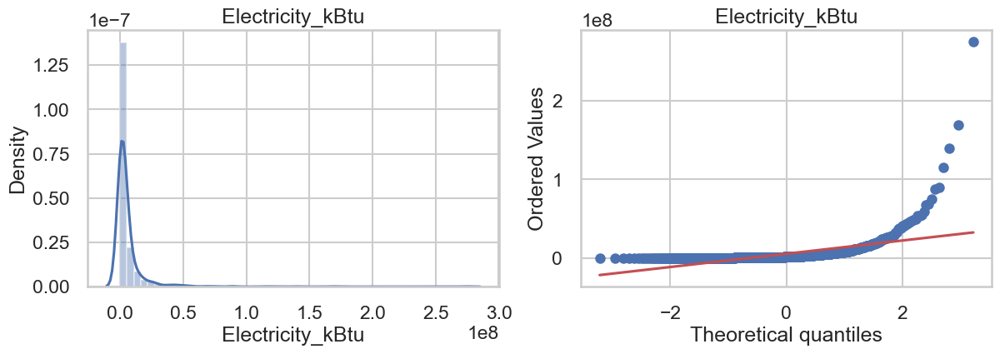

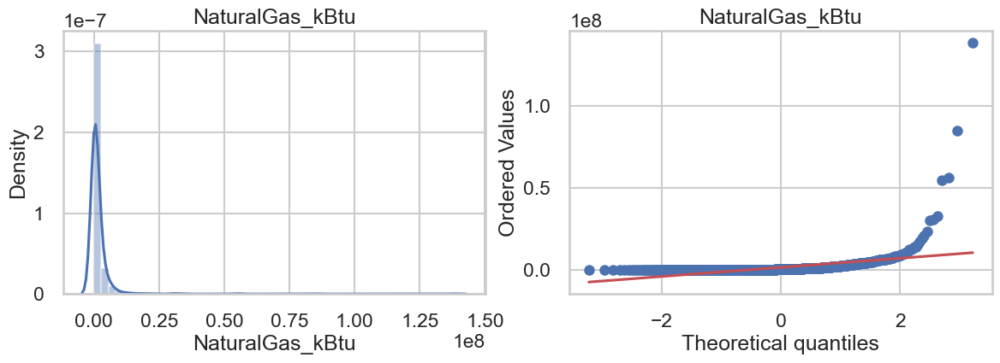

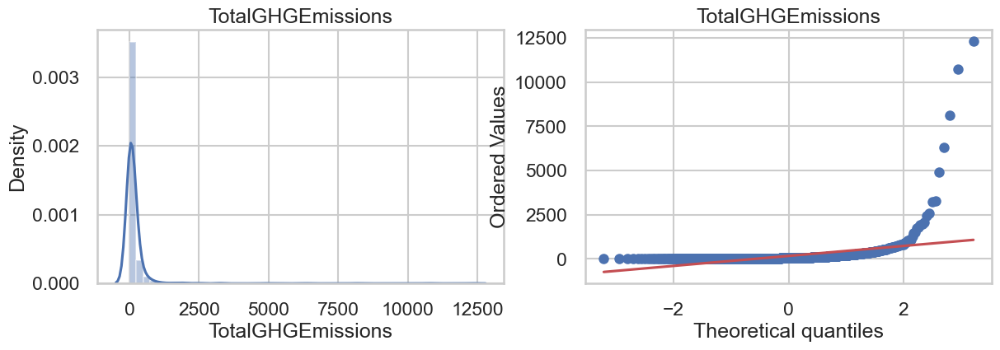

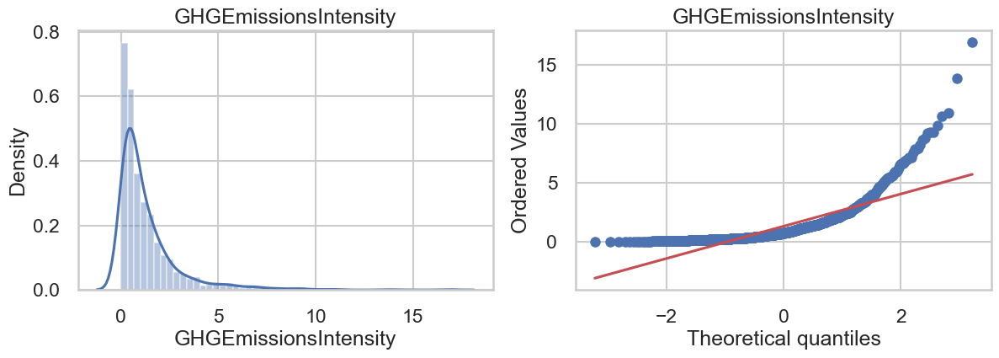

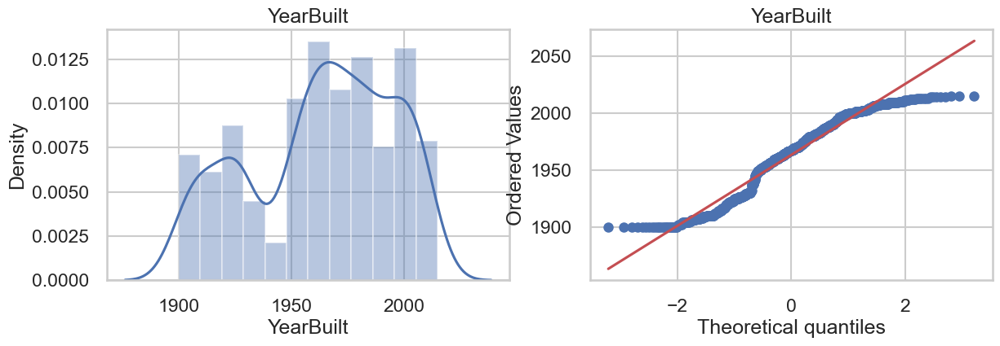

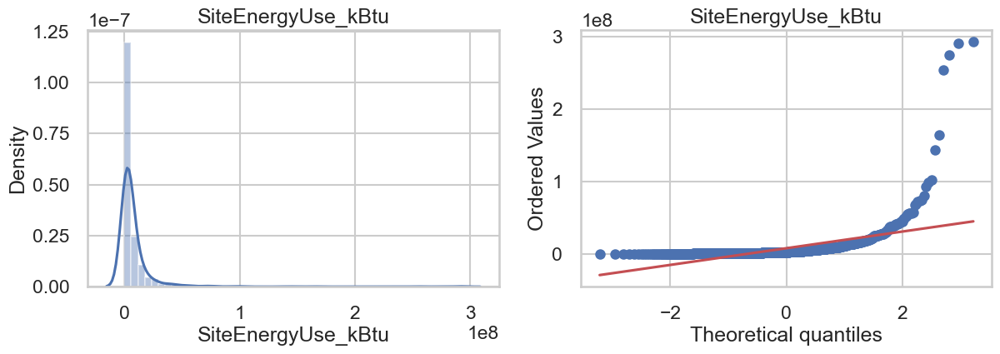

In [159]:
# Affichage des distributions avant transformations
%matplotlib inline

for col in chiffres.columns:
    fig, axes = plt.subplots(1,2, figsize = (14,4))
    sns.distplot(chiffres[col] , ax  = axes[0])
    axes[0].set_title(col)

    stats.probplot(chiffres[col] , dist ='norm' , plot =plt)
    plt.title(col)

    plt.show()


#### Transformation Yeo-Johnson

Afin de transformer les distributions nous avons le choix entre 2 mécanismes : la Box-cox ou la transformée Yeo-Johnson. Les deux méthodes sont très proches, mais suite à la présence de données non strictement positives, nous prendrons la méthode Yeo-Johnson.


In [160]:
# Application de la transformation Yeo-Johnson
pt1 = PowerTransformer()
chiffres_trans = pt1.fit_transform(chiffres)
pd.DataFrame({'cols':chiffres.columns,'Yeo_Johnson_lambdas':pt1.lambdas_})

,cols,Yeo_Johnson_lambdas
0,PropertyGFABuildings,-0.40911
1,LargestPropertyUseTypeGFA,-0.40532
2,SteamUse_kBtu,-0.99586
3,Electricity_kBtu,0.07814
4,NaturalGas_kBtu,0.12030
5,TotalGHGEmissions,-0.03908
6,GHGEmissionsIntensity,-0.96536
7,YearBuilt,14.16989
8,SiteEnergyUse_kBtu,0.05350


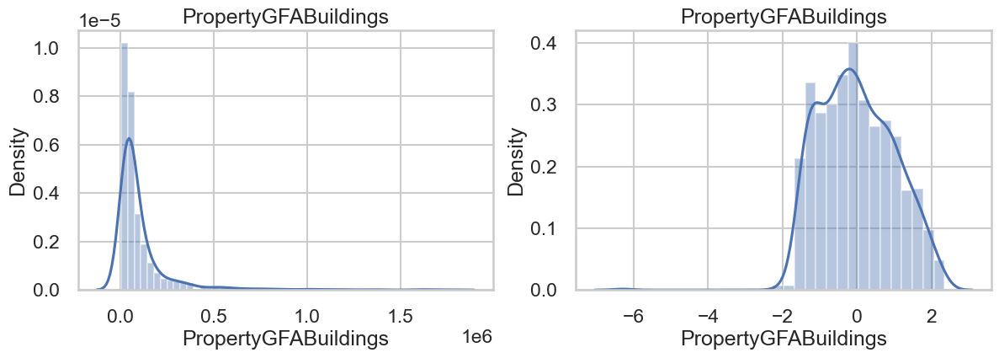

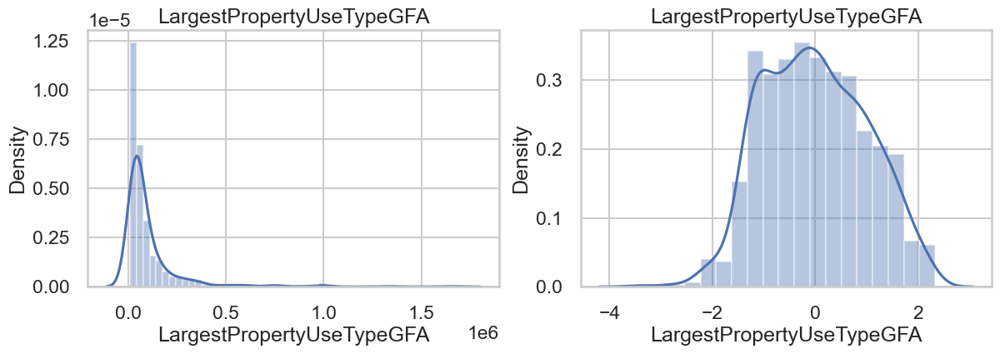

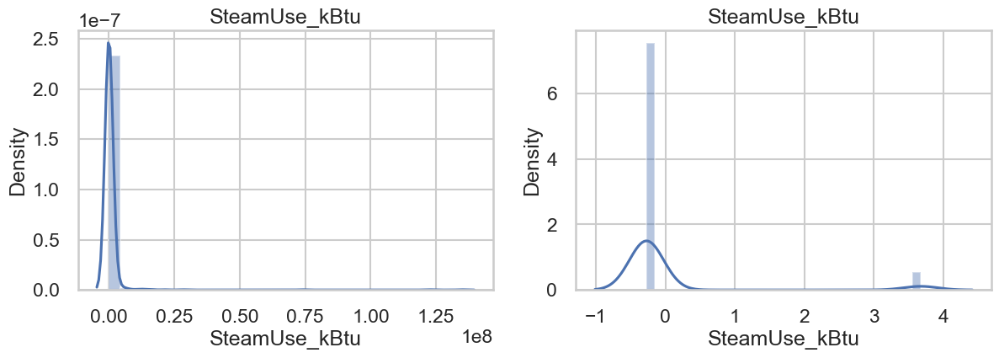

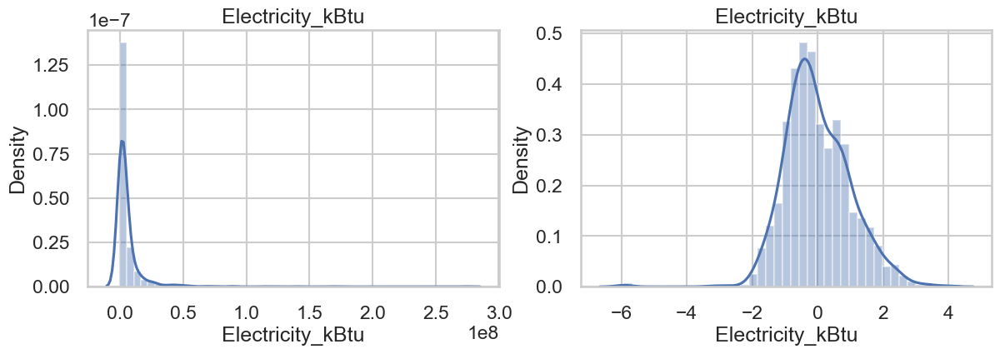

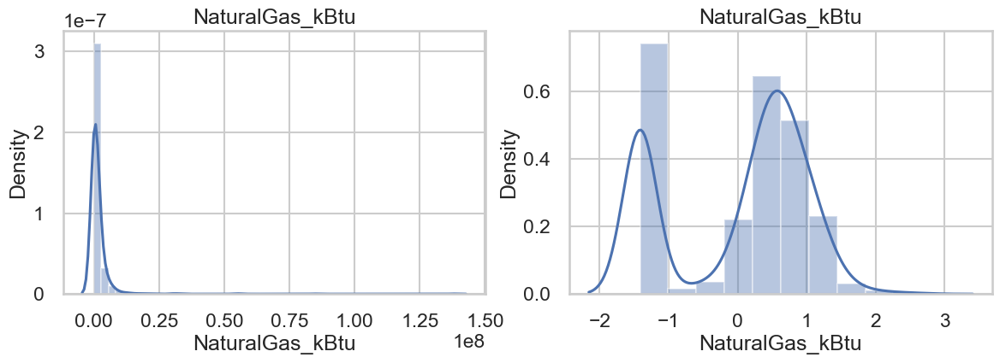

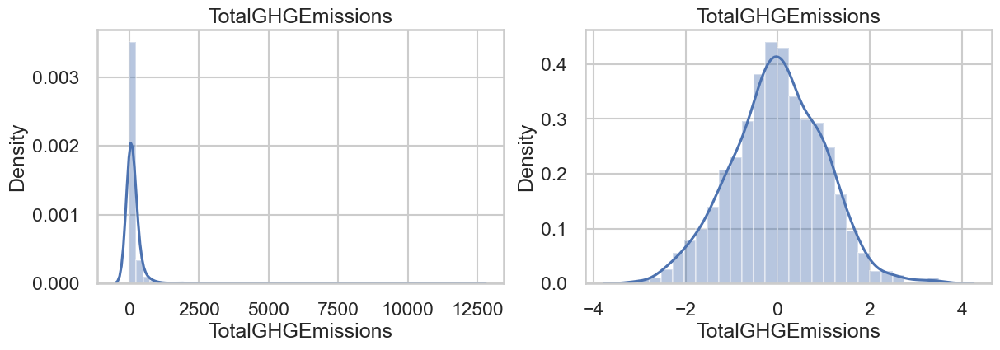

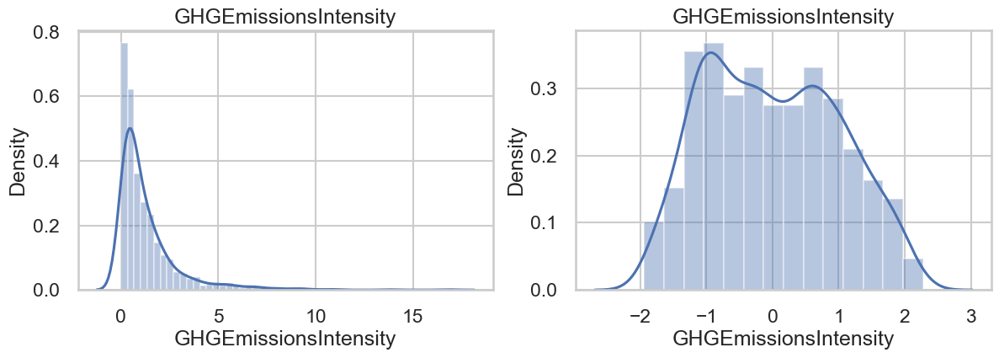

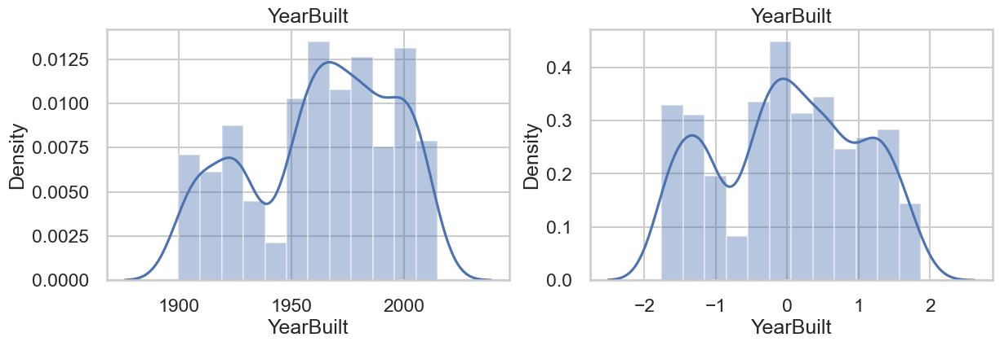

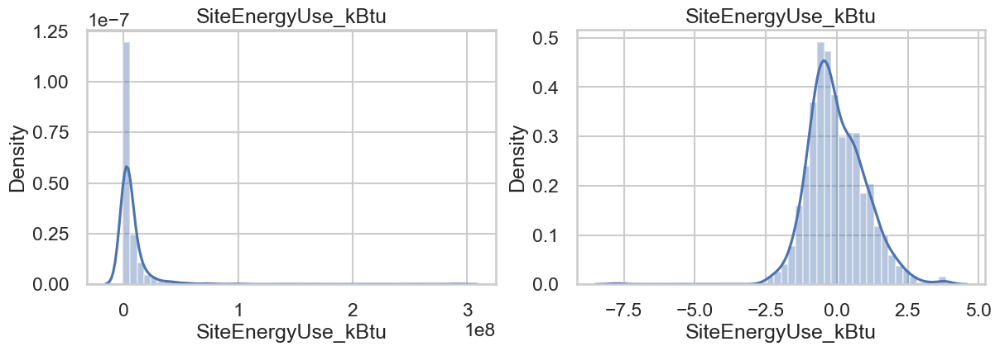

In [161]:
#Nous affichons les distribution avant et après la transformation yeo-johnson
chiffres_trans = pd.DataFrame(chiffres_trans,columns=chiffres.columns)

for col in chiffres.columns:
    plt.figure(figsize=(14,4))
    plt.subplot(121)
    sns.distplot(chiffres[col])
    plt.title(col)

    plt.subplot(122)
    sns.distplot(chiffres_trans[col])
    plt.title(col)

    plt.show()

#### Unités

Les unités énergétiques sont exprimées en Kbtu : en kilo British Thermal Units 1 kbtu = 0,293 kwh et en pieds carrés, un pied = 0,304 mètre.
Pour des raison de conformité avec l'energy star, nous faisons le choix de ne pas convertir les données.

#### Surface au sol des batiments, parcs, jardins et parkings

L’objectif de la cote ENERGY STAR est d’offrir une évaluation équitable du rendement énergétique d’une propriété, par rapport à des propriétés semblables, en tenant compte du climat, des conditions météorologiques et des activités commerciales de la propriété. Les aires de stationnement ne sont pas admissibles à la cote ENERGY STAR. Cependant, comme un stationnement est une installation commune dans d’autres types de bâtiments commerciaux (p. ex., bâtiments de bureaux et hôtels), la cote ENERGY STAR permet certains ajustements pour tenir compte de la présence d’une aire de stationnement. Le but de la cote ENERGY STAR est d’attribuer une cote de rendement énergétique à l’utilisation principale du bâtiment, et non à l’aire de stationnement.
Nous ne tiendrons donc compte que de la variable 'PropertyGFABuildings'

## Création du dataframe du travail d'analyse exploratoire

In [162]:
chiffres_trans

,PropertyGFABuildings,LargestPropertyUseTypeGFA,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity,YearBuilt,SiteEnergyUse_kBtu
0,0.55599,0.60901,3.67608,0.42789,0.70163,1.09341,1.32537,-1.14199,0.62191
1,0.55680,0.55543,-0.27203,0.28884,1.17523,1.20533,1.33460,1.06722,0.73947
2,2.04786,2.04639,3.67608,2.42499,0.75117,2.45394,1.08777,0.07960,2.55073
3,0.14396,0.21324,3.67608,0.17843,0.81316,1.18387,1.71341,-1.16704,0.57360
4,0.80412,0.92182,-0.27203,0.65036,1.38000,1.55600,1.34068,0.46072,1.16067
...,...,...,...,...,...,...,...,...,...
1069,1.59372,1.65329,-0.27203,1.23999,0.88700,0.95132,-0.65137,1.87566,1.15061
1070,0.51788,0.60586,-0.27203,0.45799,0.83336,0.65832,0.28453,1.83055,0.48203
1071,-0.17200,0.01698,-0.27203,-0.69844,0.96757,0.78410,1.38439,-0.36661,0.08587
1072,-1.17026,-1.04595,-0.27203,0.00983,0.88523,0.67767,1.80526,-1.09136,0.24090


In [163]:
# Création du dataframe final log
data_clean  = pd.DataFrame({'PropertyGFABuildings' : chiffres_trans['PropertyGFABuildings'],
                                 'LargestPropertyUseTypeGFA' : chiffres_trans['LargestPropertyUseTypeGFA'],
                                 'SteamUse_kBtu' : chiffres_trans['SteamUse_kBtu'],
                                 'Electricity_kBtu' : chiffres_trans['Electricity_kBtu'],
                                 'NaturalGas_kBtu' : chiffres_trans['NaturalGas_kBtu'],
                                 'TotalGHGEmissions' : chiffres_trans['TotalGHGEmissions'],
                                 'GHGEmissionsIntensity' : chiffres_trans['GHGEmissionsIntensity'],
                                 'YearBuilt' : chiffres_trans['YearBuilt'],
                                 'SiteEnergyUse_kBtu' : chiffres_trans['SiteEnergyUse_kBtu'],
                                 'ENERGYSTARScore' : data_clean['ENERGYSTARScore'],
                                 'SteamUse_kBtu' : data_clean['SteamUse_kBtu'],
                                 'Electricity_kBtu' : data_clean['Electricity_kBtu'],
                                 'NaturalGas_kBtu' : data_clean['NaturalGas_kBtu'],
                                 'NumberofFloors' : data_clean['NumberofFloors'],
                                 'NumberofBuildings' : data_clean['NumberofBuildings'],
                                 'Longitude' : data_clean['Longitude'],
                                 'Latitude' : data_clean['Latitude'],
                                 'Neighborhood' : data_clean['Neighborhood'],
                                 'Address' : data_clean['Address'],
                                 'PropertyName' : data_clean['PropertyName'],
                                 'PrimaryPropertyType' : data_clean['PrimaryPropertyType'],
                                 'SiteEnergyUseLog' : data_clean['SiteEnergyUseLog'],
                                 'SourceEUI_kBtu_sfLog' : data_clean['SourceEUI_kBtu_sfLog'],
                                 'SiteEUI_kBtu_sfLog' : data_clean['SiteEUI_kBtu_sfLog']})

In [164]:
# Creation du dataframe non passé au log
data  = pd.DataFrame({'PropertyGFABuildings' : chiffres['PropertyGFABuildings'],
                            'LargestPropertyUseTypeGFA' : chiffres['LargestPropertyUseTypeGFA'],
                            'SteamUse_kBtu' : chiffres['SteamUse_kBtu'],
                            'Electricity_kBtu' : chiffres['Electricity_kBtu'],
                            'NaturalGas_kBtu' : chiffres['NaturalGas_kBtu'],
                            'TotalGHGEmissions' : chiffres['TotalGHGEmissions'],
                            'GHGEmissionsIntensity' : chiffres['GHGEmissionsIntensity'],
                            'YearBuilt' : chiffres['YearBuilt'],
                            'SiteEnergyUse_kBtu' : chiffres['SiteEnergyUse_kBtu'],
                            'ENERGYSTARScore' : data_clean['ENERGYSTARScore'],
                            'SteamUse_kBtu' : data_clean['SteamUse_kBtu'],
                            'Electricity_kBtu' : data_clean['Electricity_kBtu'],
                            'NaturalGas_kBtu' : data_clean['NaturalGas_kBtu'],
                            'NumberofFloors' : data_clean['NumberofFloors'],
                            'NumberofBuildings' : data_clean['NumberofBuildings'],
                            'Longitude' : data_clean['Longitude'],
                            'Latitude' : data_clean['Latitude'],
                            'Neighborhood' : data_clean['Neighborhood'],
                            'Address' : data_clean['Address'],
                            'PropertyName' : data_clean['PropertyName'],
                            'PrimaryPropertyType' : data_clean['PrimaryPropertyType']})

In [165]:
data_clean = data_clean.fillna(data_clean.median())

## Vérification de la géolocalisation

Nous utilisons folium afin d'afficher une carte nous permettant de valider la localisation des sites pris en compte dans notre étude.

In [166]:
map = folium.Map(location=[47.6205, -122.351], zoom_start=10) # Seattle location
coordonnees =data_clean[['Latitude','Longitude']]
type = data_clean[['PrimaryPropertyType']]
loc_list = coordonnees.values.tolist()
loc_type = type.values.tolist()

for point in range(0, len(loc_list)):
    folium.Marker(loc_list[point]).add_to(map)

map


Toutes les adresses correspondent à la ville de Seattle.

## Analyse Exploratoire

### Création de dataframe d'études :

data_conso =  données d'émissions et d'utilisation d'énergie des batiments
chiffres = données de consommation énergétique des batiments

In [167]:
data_conso = data_clean[['YearBuilt', 'NumberofFloors', 'PropertyGFABuildings', 'TotalGHGEmissions', 'SiteEnergyUse_kBtu', 'GHGEmissionsIntensity','TotalGHGEmissions',  'SourceEUI_kBtu_sfLog']]

In [168]:
chiffres = data_clean[['YearBuilt', 'PropertyGFABuildings', 'LargestPropertyUseTypeGFA', 'SiteEUI_kBtu_sfLog', 'SourceEUI_kBtu_sfLog', 'SteamUse_kBtu', 'GHGEmissionsIntensity','TotalGHGEmissions','Electricity_kBtu','NaturalGas_kBtu', 'SiteEnergyUse_kBtu']]

In [169]:
chiffres.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1692 entries, 0 to 50081
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   YearBuilt                  1692 non-null   float64
 1   PropertyGFABuildings       1692 non-null   float64
 2   LargestPropertyUseTypeGFA  1692 non-null   float64
 3   SiteEUI_kBtu_sfLog         1692 non-null   float64
 4   SourceEUI_kBtu_sfLog       1692 non-null   float64
 5   SteamUse_kBtu              1692 non-null   float64
 6   GHGEmissionsIntensity      1692 non-null   float64
 7   TotalGHGEmissions          1692 non-null   float64
 8   Electricity_kBtu           1692 non-null   float64
 9   NaturalGas_kBtu            1692 non-null   float64
 10  SiteEnergyUse_kBtu         1692 non-null   float64
dtypes: float64(11)
memory usage: 223.2 KB


In [170]:
data_conso.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1692 entries, 0 to 50081
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   YearBuilt              1692 non-null   float64
 1   NumberofFloors         1692 non-null   float64
 2   PropertyGFABuildings   1692 non-null   float64
 3   TotalGHGEmissions      1692 non-null   float64
 4   SiteEnergyUse_kBtu     1692 non-null   float64
 5   GHGEmissionsIntensity  1692 non-null   float64
 6   TotalGHGEmissions      1692 non-null   float64
 7   SourceEUI_kBtu_sfLog   1692 non-null   float64
dtypes: float64(8)
memory usage: 183.5 KB


In [171]:
# Melt afin de passer les colonnes en lignes
melt_chiffres = pd.melt(chiffres)

In [172]:
melt_chiffres.head()

,variable,value
0,YearBuilt,-1.14199
1,YearBuilt,1.06722
2,YearBuilt,0.07960
3,YearBuilt,-1.16704
4,YearBuilt,0.46072


### Analyse univariée

In [173]:
moduleexplo.stat_descriptives(chiffres, ['YearBuilt', 'PropertyGFABuildings','LargestPropertyUseTypeGFA','SiteEUI_kBtu_sfLog','SourceEUI_kBtu_sfLog','SteamUse_kBtu','Electricity_kBtu', 'NaturalGas_kBtu', 'TotalGHGEmissions', 'GHGEmissionsIntensity', 'SiteEnergyUse_kBtu'])

Desc,YearBuilt,PropertyGFABuildings,LargestPropertyUseTypeGFA,SiteEUI_kBtu_sfLog,SourceEUI_kBtu_sfLog,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity,SiteEnergyUse_kBtu
mean,0.004845,-0.028454,-0.013684,3.905571,4.805421,352921.738662,4295667.241135,1206010.387116,-0.003638,-0.021269,-0.051491
median,0.013264,-0.077902,-0.037465,3.906003,4.832304,0.000000,1775076.000000,440675.500000,-0.009961,-0.058233,-0.140976
var,0.634793,0.636159,0.635077,0.365903,0.412289,24452393142181.726562,136203621959816.812500,23867899567030.066406,0.634775,0.635538,0.639359
std,0.796739,0.797596,0.796917,0.604899,0.642097,4944936.111031,11670630.743872,4885478.437884,0.796728,0.797206,0.799600
skew,-0.122053,0.147363,0.169397,-0.286903,-0.665406,23.039447,11.935484,18.292823,0.009894,0.298089,0.332176
kurtosis,0.097446,2.496165,0.743972,4.814468,6.547844,573.544540,213.896810,435.251240,1.961958,0.211938,7.266887
mode,0 0.01326,0 -0.0779,0 -0.03747,0 3.906,0 4.8323,0 0.0,0 1775076.0,0 440675.5,0 -0.00996,0 -0.05823,0 -0.14098
Min,-1.761598,-6.301926,-3.448049,0.000000,0.000000,0.000000,0.000000,0.000000,-3.031347,-1.943540,-7.753061
Max,1.875656,2.356743,2.332920,6.727911,7.871311,134943456.000000,274532495.000000,138191238.000000,3.508477,2.278521,3.838591


#### Affichage des distributions

In [174]:
#Création des df d'affichage des graphique d'analyse univariés
df_year=melt_chiffres[melt_chiffres['variable'] == 'YearBuilt']
df_property=melt_chiffres[melt_chiffres['variable'] == 'PropertyGFABuildings']
df_largest_property_use=melt_chiffres[melt_chiffres['variable'] == 'LargestPropertyUseTypeGFA']
df_site_eui=melt_chiffres[melt_chiffres['variable'] == 'SiteEUI_kBtu_sfLog']
df_source_eui=melt_chiffres[melt_chiffres['variable'] == 'SourceEUI_kBtu_sfLog']
df_steam_use=melt_chiffres[melt_chiffres['variable'] == 'SteamUse_kBtu']
df_electricity=melt_chiffres[melt_chiffres['variable'] == 'Electricity_kBtu']
df_natural_gas=melt_chiffres[melt_chiffres['variable'] == 'NaturalGas_kBtu']
df_total_ghg_emissions = melt_chiffres[melt_chiffres['variable'] == 'TotalGHGEmissions']
df_ghg_emission_intensity = melt_chiffres[melt_chiffres['variable'] == 'GHGEmissionsIntensity']
df_site_energy = melt_chiffres[melt_chiffres['variable'] == 'SiteEnergyUse_kBtu']

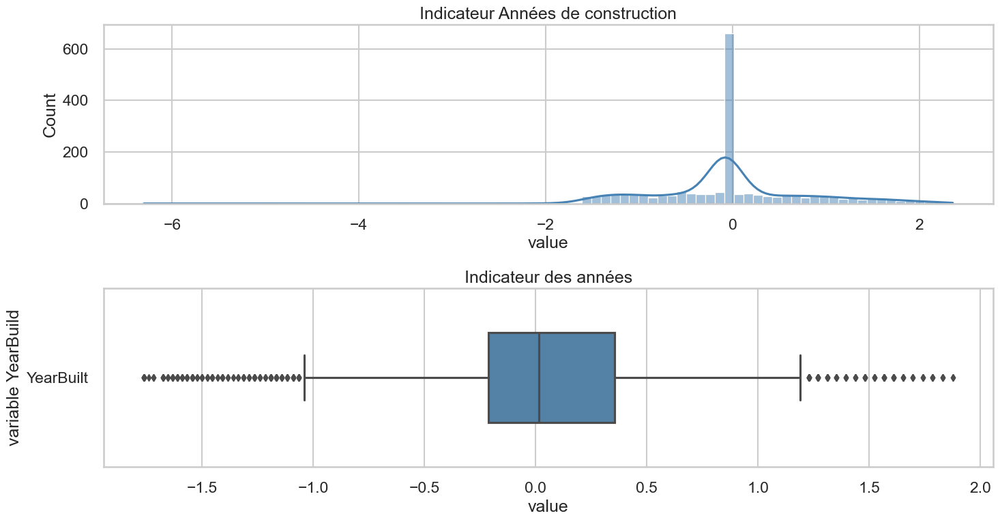

In [175]:
# Indicateur Années de construction
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_property['value'], kde = True, color='SteelBlue')
plt.title("Indicateur Années de construction")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_year['value'], y=df_year['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title("Indicateur des années")
plt.ylabel("variable YearBuild")

plt.tight_layout()

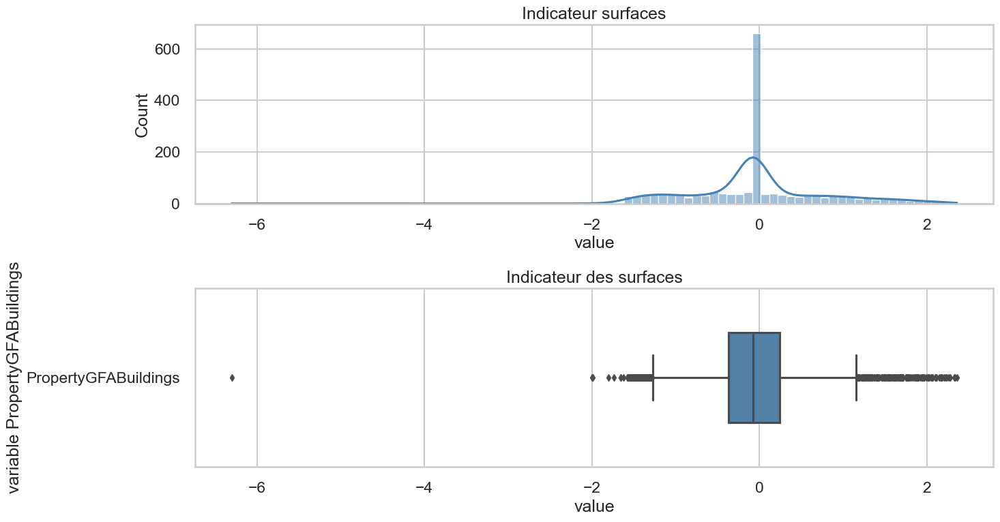

In [176]:
# Indicateur Surface total des propriétés
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_property['value'], kde = True, color='SteelBlue')
plt.title("Indicateur surfaces")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_property['value'], y=df_property['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title("Indicateur des surfaces")
plt.ylabel("variable PropertyGFABuildings")

plt.tight_layout()

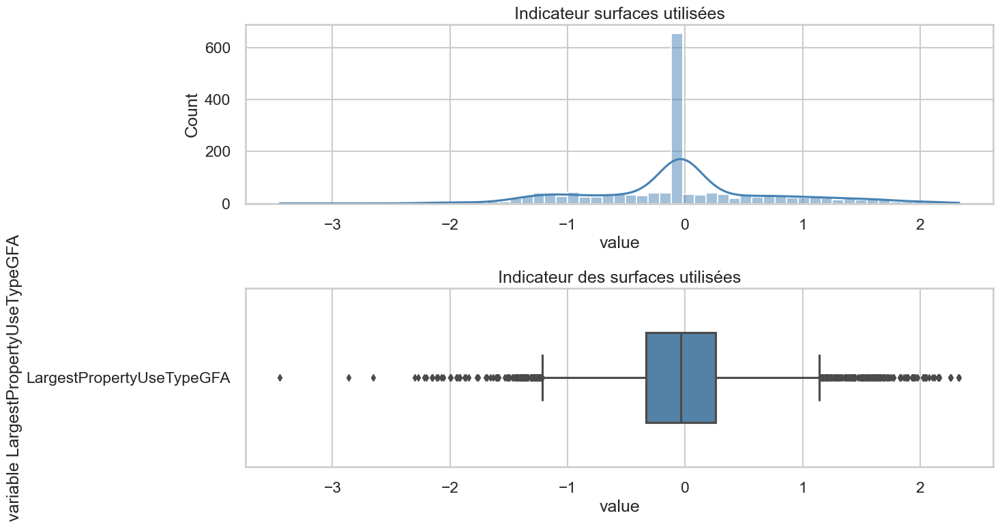

In [177]:
# Indicateur Surface total utilisées des propriétés
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_largest_property_use['value'], kde = True, color='SteelBlue')
plt.title("Indicateur surfaces utilisées")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_largest_property_use['value'], y=df_largest_property_use['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur des surfaces utilisées')
plt.ylabel("variable LargestPropertyUseTypeGFA")

plt.tight_layout()

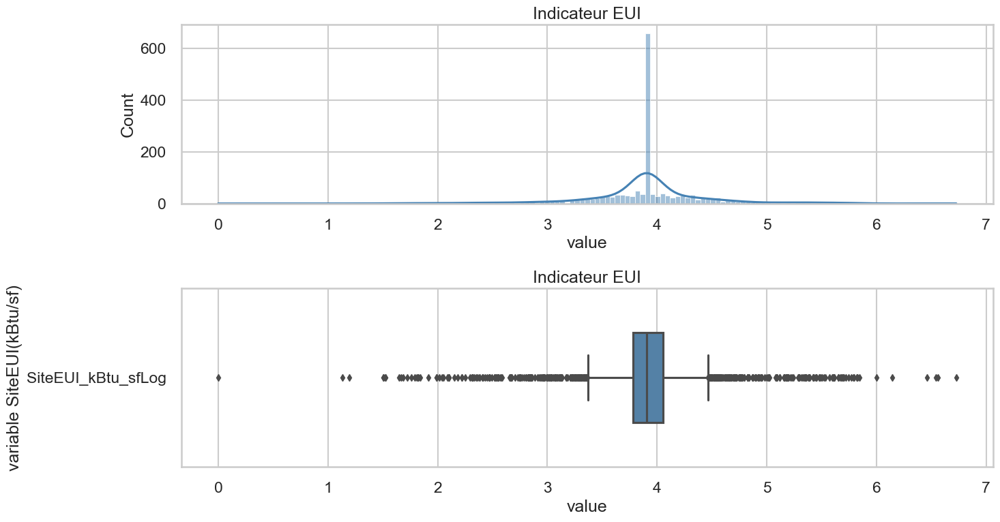

In [178]:
# Indicateur Intensité d'utilisation de l'énergie du site
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_site_eui['value'], kde = True, color='SteelBlue')
plt.title("Indicateur EUI")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_site_eui['value'], y=df_site_eui['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur EUI')
plt.ylabel("variable SiteEUI(kBtu/sf)")

plt.tight_layout()

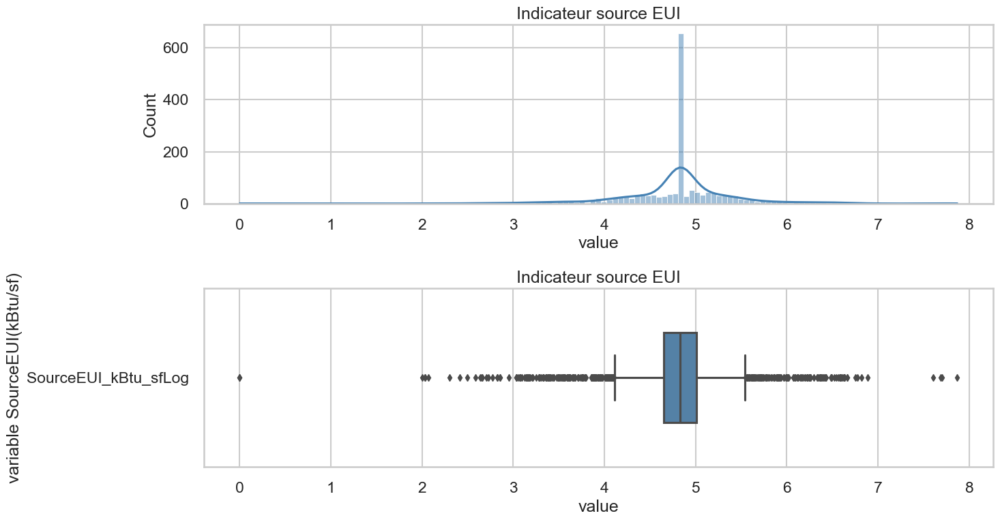

In [179]:
# Indicateur Intensité d'utilisation de l'énergie par source
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_source_eui['value'], kde = True, color='SteelBlue')
plt.title("Indicateur source EUI")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_source_eui['value'], y=df_source_eui['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur source EUI')
plt.ylabel("variable SourceEUI(kBtu/sf)")

plt.tight_layout()

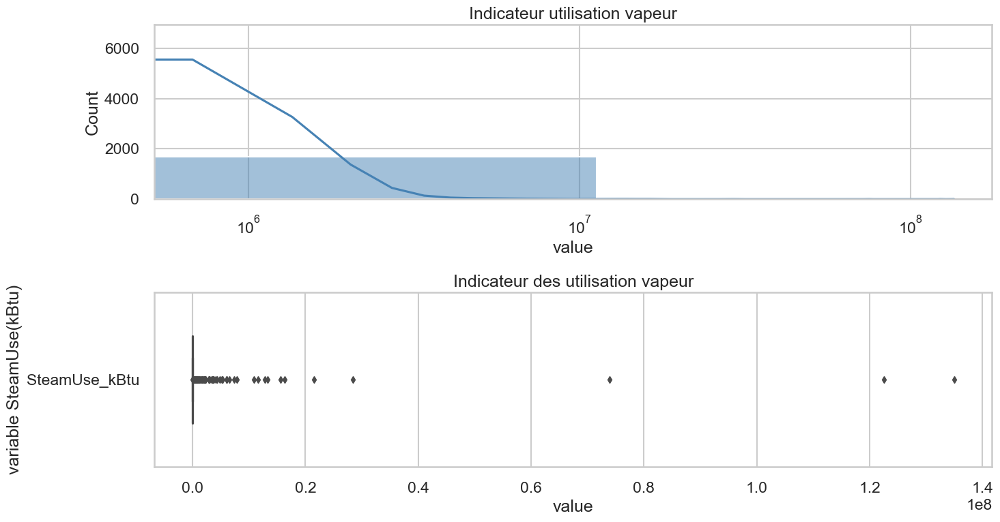

In [180]:
# Indicateur utilisation de vapeur (chauffage)
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_steam_use['value'], kde = True, color='SteelBlue')
plt.xscale('log')
plt.title("Indicateur utilisation vapeur")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_steam_use['value'], y=df_steam_use['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur des utilisation vapeur')
plt.ylabel("variable SteamUse(kBtu)")

plt.tight_layout()

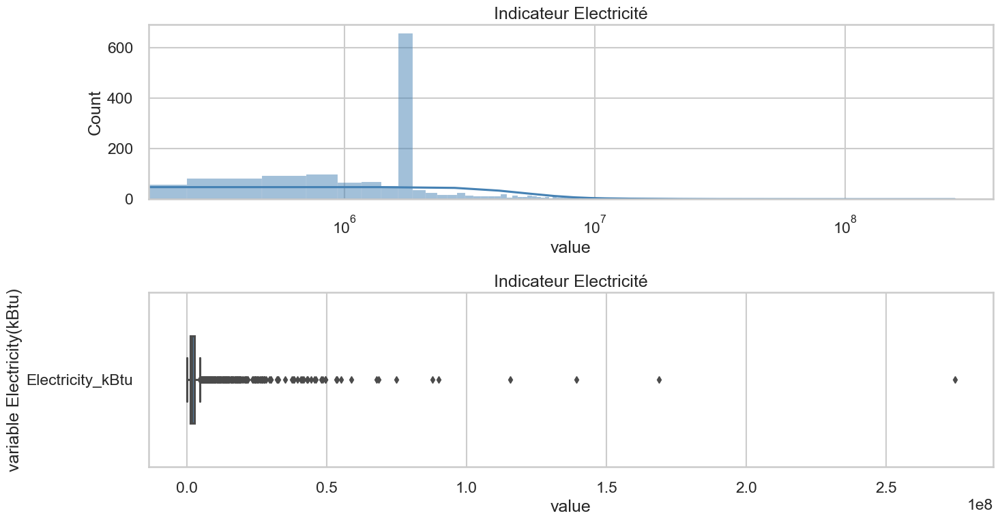

In [181]:
# Indicateur Électricité
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_electricity['value'], kde = True, color='SteelBlue')
plt.xscale('log')
plt.title("Indicateur Electricité")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_electricity['value'], y=df_electricity['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur Electricité')
plt.ylabel("variable Electricity(kBtu)")

plt.tight_layout()

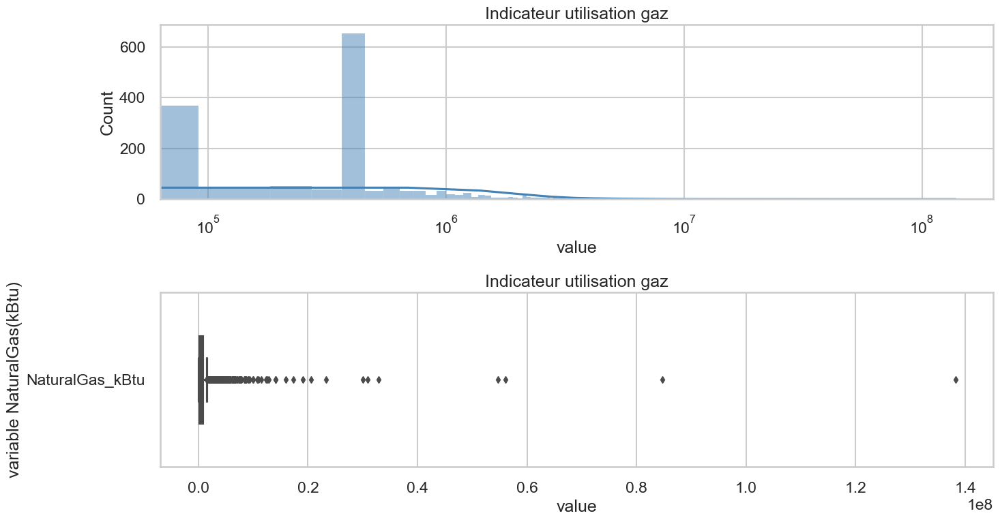

In [182]:
# Indicateur utilisation du gaz naturel
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_natural_gas['value'], kde = True, color='SteelBlue')
plt.xscale('log')
plt.title("Indicateur utilisation gaz")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_natural_gas['value'], y=df_natural_gas['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur utilisation gaz')
plt.ylabel("variable NaturalGas(kBtu)")

plt.tight_layout()

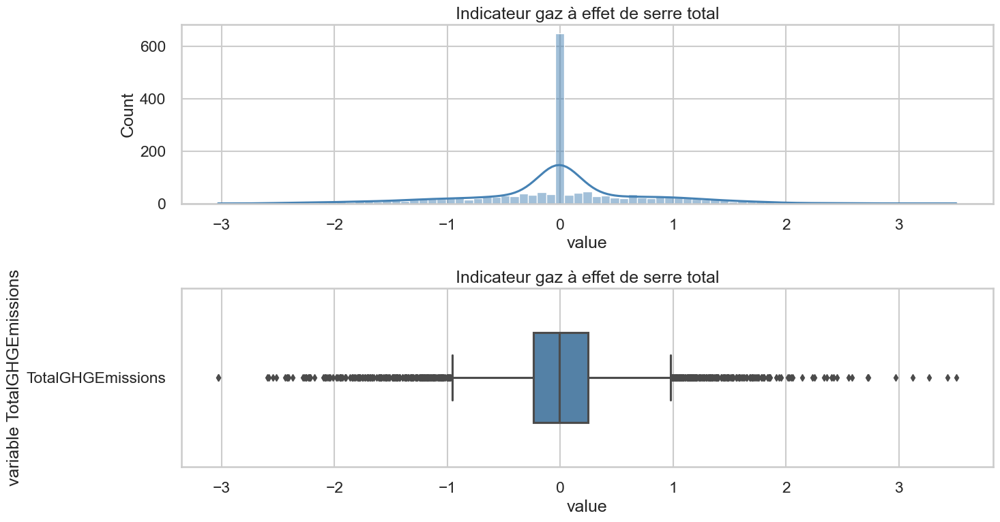

In [183]:
# Indicateur émission totale de gaz à effets de serre
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_total_ghg_emissions['value'], kde = True, color='SteelBlue')
plt.title("Indicateur gaz à effet de serre total")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_total_ghg_emissions['value'], y=df_total_ghg_emissions['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur gaz à effet de serre total')
plt.ylabel("variable TotalGHGEmissions")

plt.tight_layout()

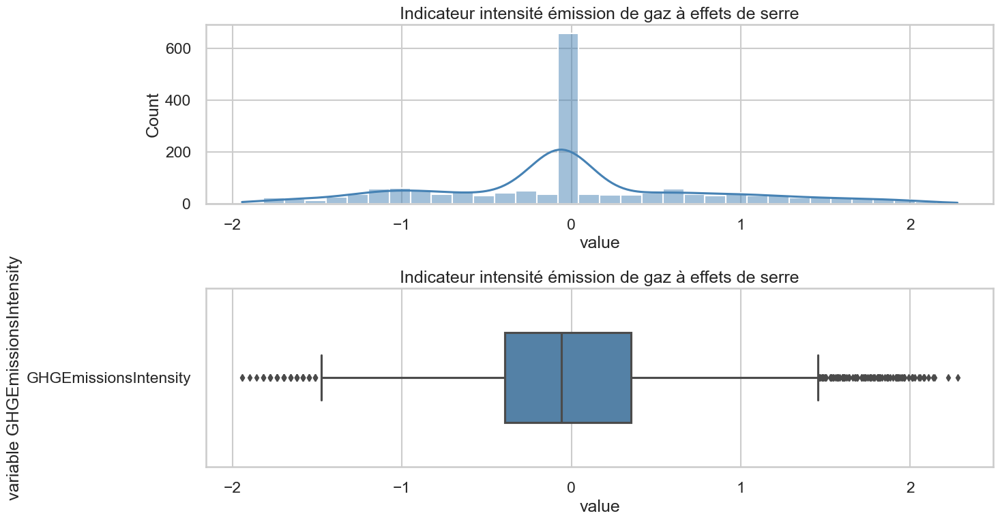

In [184]:
# Indicateur intensité émission de gaz à effets de serre
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_ghg_emission_intensity['value'], kde = True, color='SteelBlue')
plt.title("Indicateur intensité émission de gaz à effets de serre")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_ghg_emission_intensity['value'], y=df_ghg_emission_intensity['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur intensité émission de gaz à effets de serre')
plt.ylabel("variable GHGEmissionsIntensity")

plt.tight_layout()

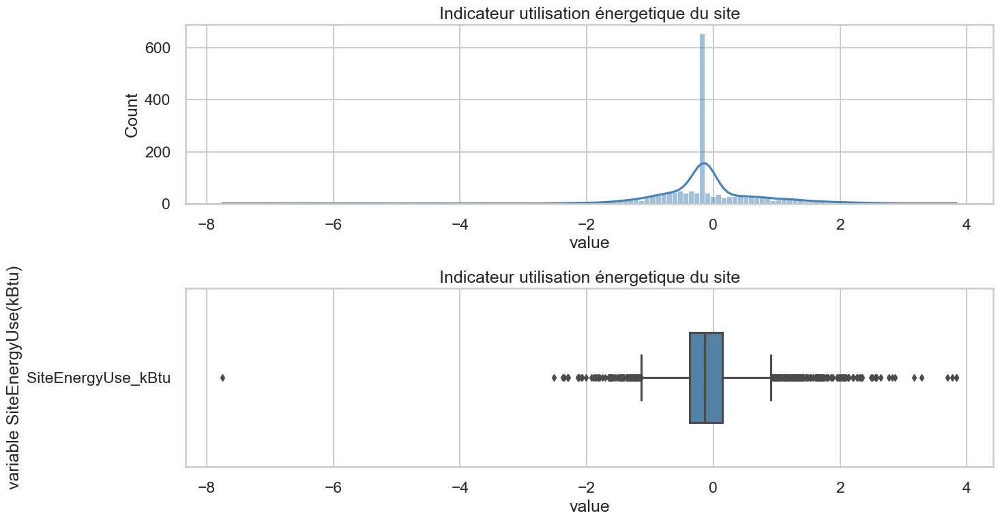

In [185]:
# Indicateur intensité Utilisation énergetique du site
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_site_energy['value'], kde = True, color='SteelBlue')
plt.title("Indicateur utilisation énergetique du site")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_site_energy['value'], y=df_site_energy['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur utilisation énergetique du site')
plt.ylabel("variable SiteEnergyUse(kBtu)")

plt.tight_layout()

Nous avons les distributions qui ont pour la grande majorité une distribution normale centrée, bien qu'elles soient plus plates, suite au passage au logarithme.
Nous voyons que les variances sont importantes, et nous pouvons noter la présence de données extremes. Les features représentants les sources d'énergie : éléctricité, gaz naturel et vapeur, ne sont pas celles qui ont été passées au logarithme.


#### Affichage du graphique PairPlot


La fonction PairPlot créé une grille d'axes de telle sorte que chaque variable numérique des données sera partagée sur l'axe des y sur une seule ligne et sur l'axe des x sur une seule colonne. Les Axes diagonaux sont traités différemment, en traçant un graphique pour montrer la distribution univariée des données pour la variable dans cette colonne par rapport à celle qui est en ligne. Ce graphique nous permettra d'aborder l'analyse bi-variée en nous permettant de choisir les paires de variables les plus intéressantes à étudier.

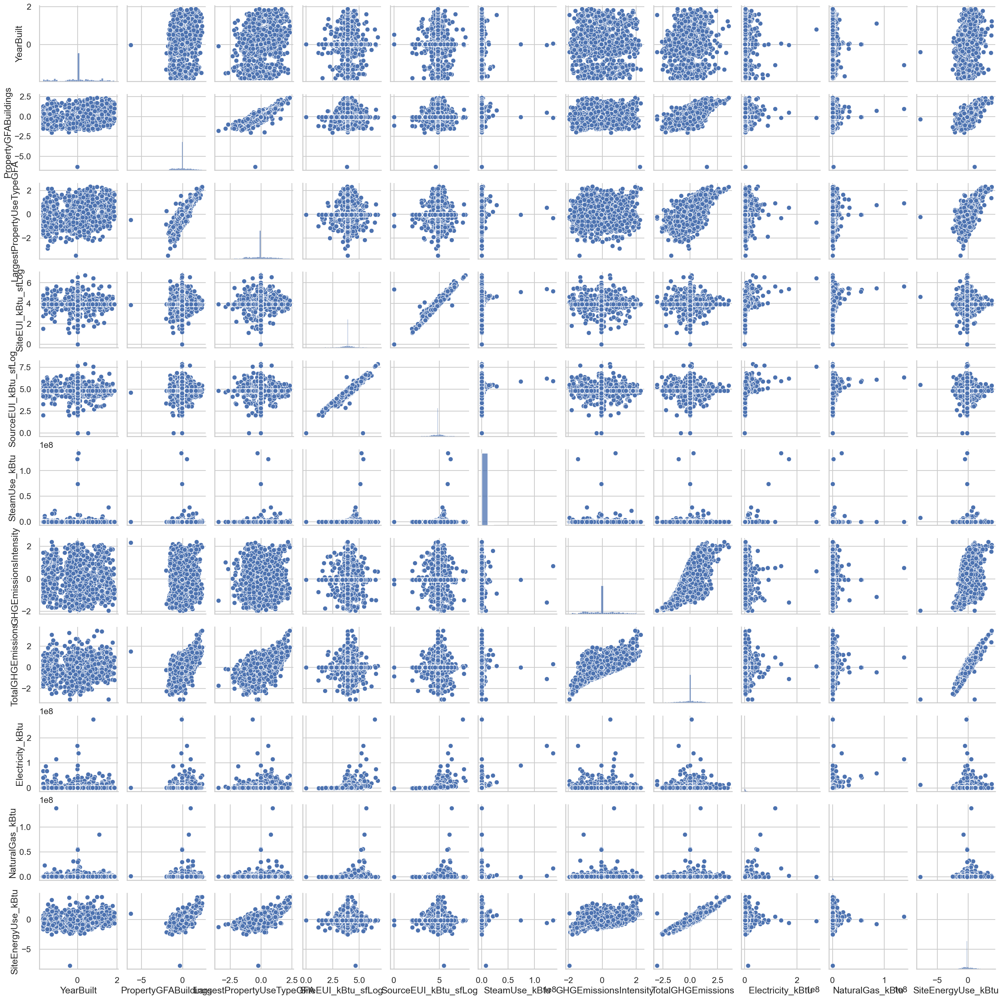

In [186]:
sns.pairplot(chiffres);

Nous observons que certaines features sont corellées, il est en revanche important de bien les discerner, nous avons en effet des features regroupant des informations très proches :
- Les features 'LargestPropertyUseTypeGFA' et 'PropertyGFABuildings' sont corrélées, mais elles regroupent des informations très similaires : la surface au sol des propriétés
- Les features 'GHGEmissionsIntensity' et 'TotalGHGEmissions' sont elles aussi corrélées car les informations sont similaires : l'émission des gaz à effet de serre


- Il est en revanche observable que les variables avec les informations de surface au sol des propriétés sont faiblement corrélées avec les emissions de gaz à effet de serre.
- Toutefois la variable 'SiteEnergyUse_kBtu' correspondant à la consommation total d'energie, pour toutes les sources d'énergies, est fortement corrélée avec la variable 'TotalGHGEmissions' qui correspond au total des émissions de gaz à effet de serre.
- La variable 'SiteEnergyUse_kBtu' est aussi corrélée avec les variables de surfaces.

#### Table de corrélation

In [187]:
#Affichage de la table de corrélation
chiffres.corr()

,YearBuilt,PropertyGFABuildings,LargestPropertyUseTypeGFA,SiteEUI_kBtu_sfLog,SourceEUI_kBtu_sfLog,SteamUse_kBtu,GHGEmissionsIntensity,TotalGHGEmissions,Electricity_kBtu,NaturalGas_kBtu,SiteEnergyUse_kBtu
YearBuilt,1.00000,0.24717,0.29297,-0.00175,-0.01422,-0.00384,-0.09557,0.13936,-0.01111,-0.00434,0.26295
PropertyGFABuildings,0.24717,1.00000,0.93212,0.03238,0.01992,0.02571,-0.01378,0.62010,0.06502,0.07732,0.74795
LargestPropertyUseTypeGFA,0.29297,0.93212,1.00000,0.01805,0.00678,0.02447,0.00288,0.61991,0.04382,0.07553,0.74078
SiteEUI_kBtu_sfLog,-0.00175,0.03238,0.01805,1.00000,0.92049,0.11654,-0.02097,-0.00607,0.32952,0.26260,0.00478
SourceEUI_kBtu_sfLog,-0.01422,0.01992,0.00678,0.92049,1.00000,0.09869,-0.02760,-0.02481,0.35191,0.19235,-0.00761
SteamUse_kBtu,-0.00384,0.02571,0.02447,0.11654,0.09869,1.00000,-0.00963,-0.00255,0.49337,0.06041,-0.00092
GHGEmissionsIntensity,-0.09557,-0.01378,0.00288,-0.02097,-0.02760,-0.00963,1.00000,0.73179,-0.03065,0.01123,0.40401
TotalGHGEmissions,0.13936,0.62010,0.61991,-0.00607,-0.02481,-0.00255,0.73179,1.00000,0.00295,0.05474,0.86032
Electricity_kBtu,-0.01111,0.06502,0.04382,0.32952,0.35191,0.49337,-0.03065,0.00295,1.00000,0.36183,0.02763
NaturalGas_kBtu,-0.00434,0.07732,0.07553,0.26260,0.19235,0.06041,0.01123,0.05474,0.36183,1.00000,0.04407


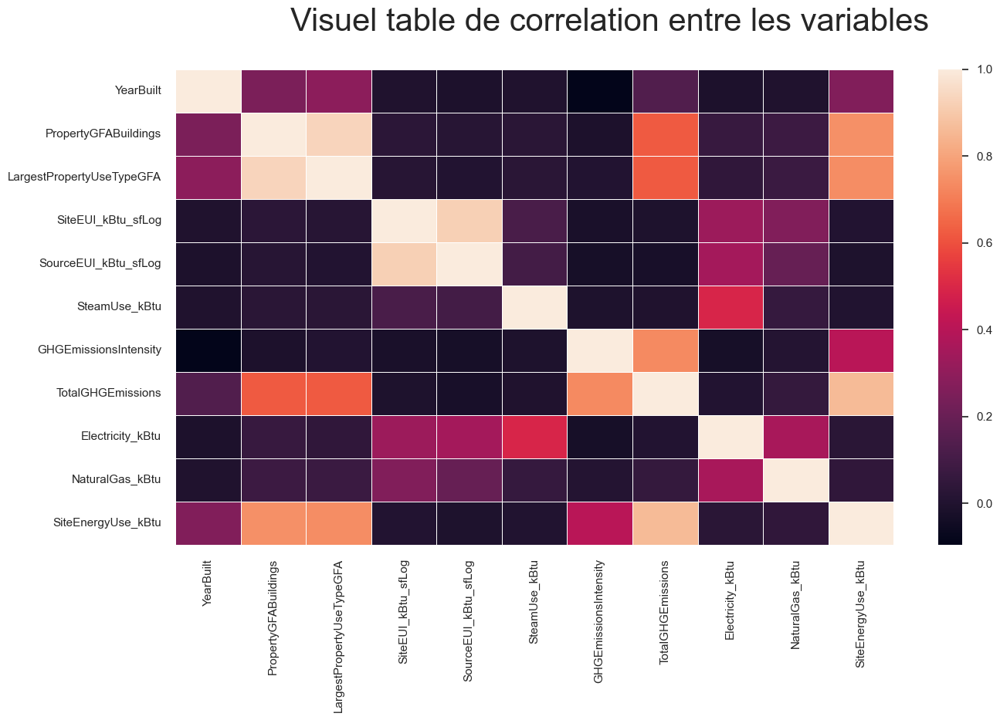

In [188]:
#On donne un aspect graphique à nos valeurs de corrélation
fig = plt.figure(figsize=(15,8))
fig.suptitle('Visuel table de correlation entre les variables', fontsize=30)

chiffres.corr()
sns.set(font_scale=1)
ax = sns.heatmap(chiffres.corr(), linewidths=.5)

La table de corrélation confirme les observations que nous avons pu réaliser sur le pairplot. Il sera intéressant de le matérialiser sur un graphique.

### Analyse Bivariée

#### Représentation graphique de la corrélation de certaines features

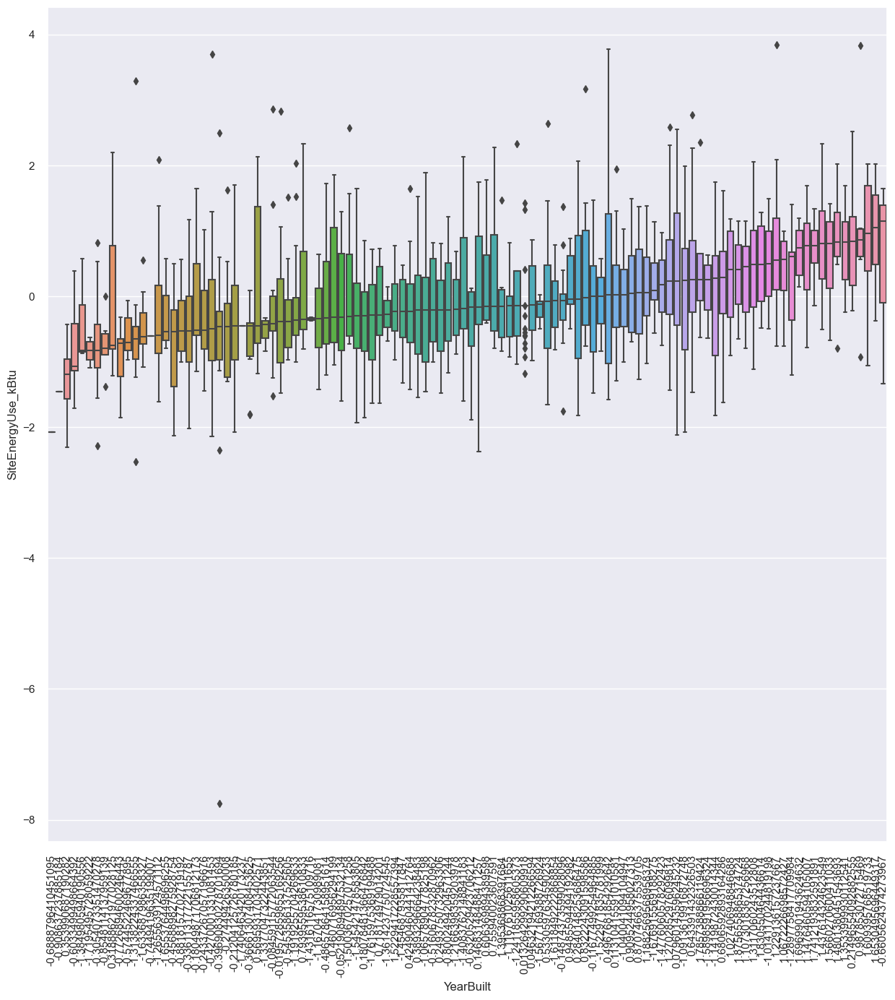

In [189]:
# On regarde la consommation 'SiteEUIWN(kBtu/sf)' en fonction du "YearBuilt'.

plt.figure(figsize=(15,15))
siteEUIWN_order = chiffres.groupby("YearBuilt").median()['SiteEnergyUse_kBtu'].sort_values().index
sns.boxplot(x=data_clean["YearBuilt"], y=data_clean["SiteEnergyUse_kBtu"],
            showmeans=True, meanprops={"marker": "+", "markeredgecolor": "black", "markersize": "10"}, order=siteEUIWN_order)

plt.xticks(rotation=90)
plt.show()

Nous pouvons observer que plus les batiments sont récent, plus ils sont éneregivore.

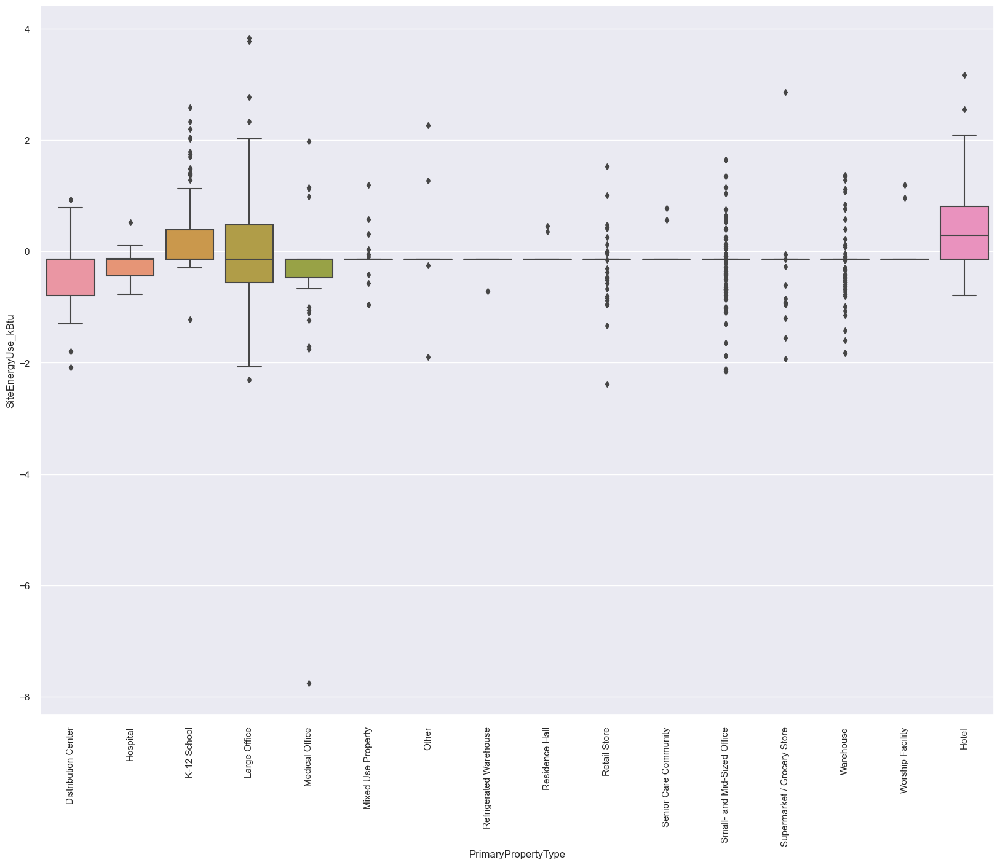

In [190]:
# On regarde la consommation 'SiteEUIWN(kBtu/sf)' en fonction du 'PrimaryPropertyType'.
plt.figure(figsize=(20,15))

siteEUIWN_order = data_clean.groupby("PrimaryPropertyType").median()['SiteEnergyUse_kBtu'].sort_values().index
sns.boxplot(x=data_clean["PrimaryPropertyType"], y=data_clean["SiteEnergyUse_kBtu"],
            showmeans=True, meanprops={"marker": "+", "markeredgecolor": "black", "markersize": "10"}, order=siteEUIWN_order)
plt.xticks(rotation=90)

plt.show()

Les supermarchés et les établissements scolaires, ainsi que la catégorie 'other', présentes des outliers. En revanche, les grands bureaux, les établissements scolaires et les hotels sont les valeurs ayant les plus grandes iqr. Les établissements médicaux, et d'analyse médicale sont aussi dans ce cas.
 En outre, nos observations préalable ont montré que les plus grandes consommation d'énergie sont réalisées par les hopitaux, cette observation n'est pas réalisée dans ce graphique.

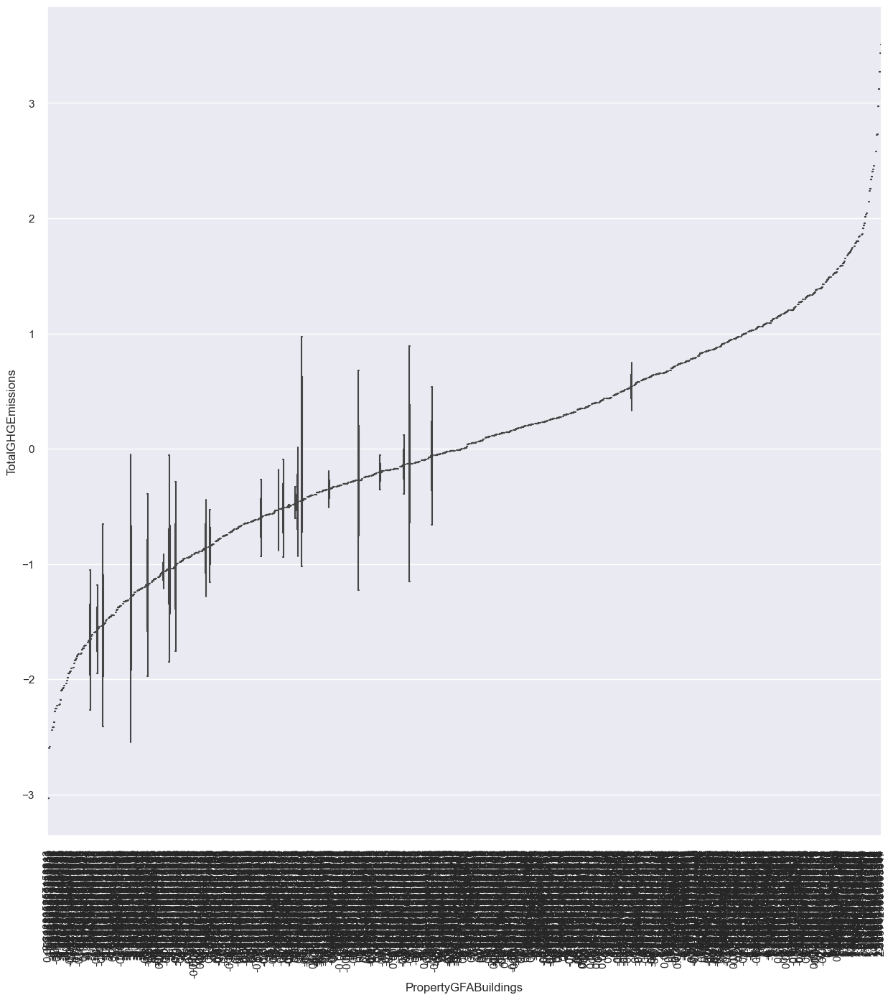

In [191]:
# On regarde la consommation 'TotalGHGEmissions' en fonction du "PropertyGFATotal'.

plt.figure(figsize=(15,15))
siteEUIWN_order = data_clean.groupby("PropertyGFABuildings").median()['TotalGHGEmissions'].sort_values().index
sns.boxplot(x=chiffres["PropertyGFABuildings"], y=chiffres["TotalGHGEmissions"],
            showmeans=True, meanprops={"marker": "+", "markeredgecolor": "black", "markersize": "10"}, order=siteEUIWN_order)


plt.xticks(rotation=90)

plt.show()

Il est notable et confirmé que la consommation totale des sites est fortement corrélée à la taille des batiments.

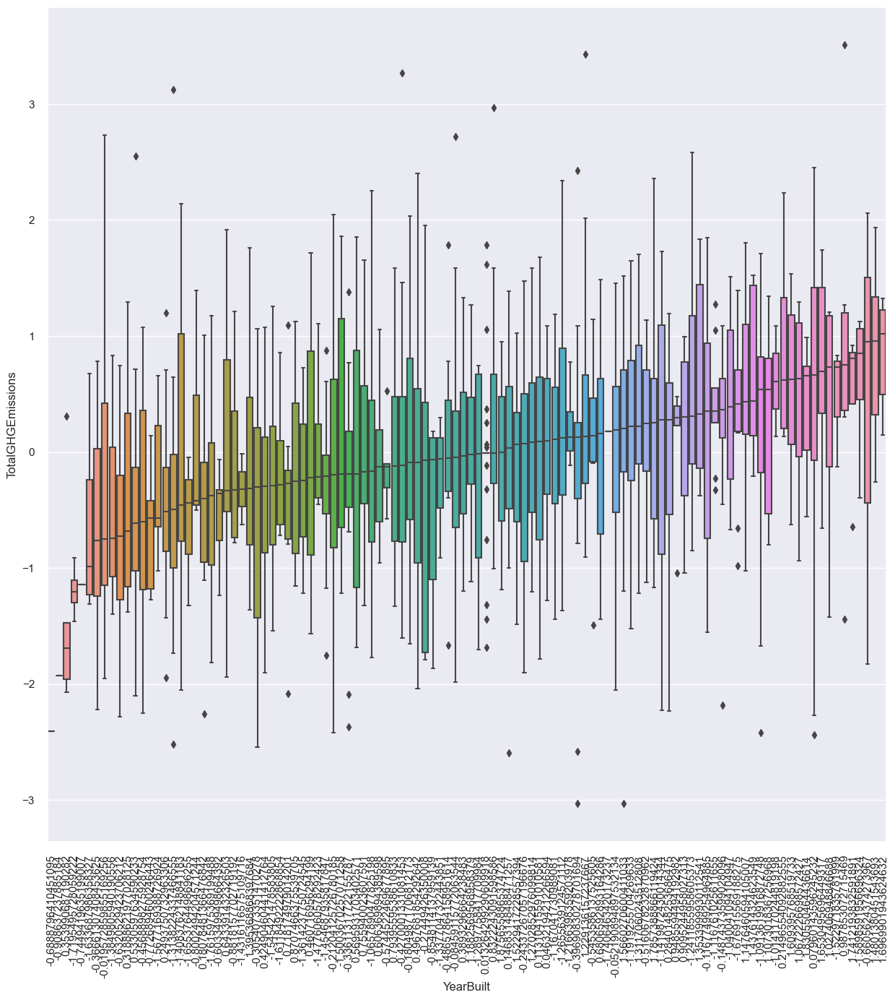

In [192]:
# On regarde la consommation 'SiteEUIWN(kBtu/sf)' en fonction du "YearBuilt'.

plt.figure(figsize=(15,15))
siteEUIWN_order = data_clean.groupby("YearBuilt").median()['TotalGHGEmissions'].sort_values().index
sns.boxplot(x=data_clean["YearBuilt"], y=data_clean["TotalGHGEmissions"],
            showmeans=True, meanprops={"marker": "+", "markeredgecolor": "black", "markersize": "10"}, order=siteEUIWN_order)


plt.xticks(rotation=90)
plt.show()

Les bâtiments les moins récents, sont moins producteurs de gaz à effet de serre.

#### ANOVA

In [193]:
chiffres.head()

,YearBuilt,PropertyGFABuildings,LargestPropertyUseTypeGFA,SiteEUI_kBtu_sfLog,SourceEUI_kBtu_sfLog,SteamUse_kBtu,GHGEmissionsIntensity,TotalGHGEmissions,Electricity_kBtu,NaturalGas_kBtu,SiteEnergyUse_kBtu
0,-1.14199,0.55599,0.60901,3.90600,4.83230,0.0,1.32537,1.09341,1775076.0,440675.5,0.62191
1,1.06722,0.55680,0.55543,4.41522,5.21221,2003882.0,1.33460,1.20533,3946027.0,1276453.0,0.73947
2,0.07960,2.04786,2.04639,4.56226,5.17671,0.0,1.08777,2.45394,3242851.0,5145082.0,2.55073
3,-1.16704,0.14396,0.21324,4.57471,5.49265,21566554.0,1.71341,1.18387,49526664.0,1493800.0,0.57360
4,0.46072,0.80412,0.92182,3.90600,4.83230,0.0,1.34068,1.55600,1775076.0,440675.5,1.16067


In [194]:
chiffres.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1692 entries, 0 to 50081
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   YearBuilt                  1692 non-null   float64
 1   PropertyGFABuildings       1692 non-null   float64
 2   LargestPropertyUseTypeGFA  1692 non-null   float64
 3   SiteEUI_kBtu_sfLog         1692 non-null   float64
 4   SourceEUI_kBtu_sfLog       1692 non-null   float64
 5   SteamUse_kBtu              1692 non-null   float64
 6   GHGEmissionsIntensity      1692 non-null   float64
 7   TotalGHGEmissions          1692 non-null   float64
 8   Electricity_kBtu           1692 non-null   float64
 9   NaturalGas_kBtu            1692 non-null   float64
 10  SiteEnergyUse_kBtu         1692 non-null   float64
dtypes: float64(11)
memory usage: 223.2 KB


In [195]:
#Traçage du tableau ANOVA
anova_nutrition = smf.ols('PropertyGFABuildings~SiteEnergyUse_kBtu', data=chiffres).fit()
print(anova_nutrition.summary())

                             OLS Regression Results                             
Dep. Variable:     PropertyGFABuildings   R-squared:                       0.559
Model:                              OLS   Adj. R-squared:                  0.559
Method:                   Least Squares   F-statistic:                     2146.
Date:                  Mon, 06 Mar 2023   Prob (F-statistic):          4.07e-303
Time:                          18:34:30   Log-Likelihood:                -1324.7
No. Observations:                  1692   AIC:                             2653.
Df Residuals:                      1690   BIC:                             2664.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept       

Nous pouvons observer une très forte corrélation entre la variable PropertyGFATotal et la variable SiteEnergyUse_kBtu. Le F-statistic est à 2086 et le prob (fisher) est à 0. Nous pouvons donc rejeter l’hypothèse nulles.

In [196]:
# Test de fisher
sm.stats.anova_lm(anova_nutrition, typ=2)

,sum_sq,df,F,PR(>F)
SiteEnergyUse_kBtu,602.15593,1.0,2145.91008,4.06735e-303
Residual,474.22468,1690.0,NaN,NaN


Le test fisher confirme notre Anova

#### CHI 2

In [197]:
# On calcul le CHI2 du SiteEnergyUse_kBtu en fonction du PropertyGFATotal
def CHI2 (serie1, serie2):
    tab_cont = pd.crosstab(serie1.array, serie2.array)
    chi2, p, dof, expected_table = chi2_contingency(tab_cont.values)
    print(f'chi2 = {chi2}, p-value = {p}, degrees of liberty = {dof}')

In [199]:
CHI2(data_clean.SiteEnergyUse_kBtu, data_clean.PropertyGFABuildings)

chi2 = 1766448.0000000019, p-value = 0.0, degrees of liberty = 1121256


In [201]:
import seaborn as sns
x = pd.cut(chiffres['SiteEnergyUse_kBtu'], 3)

for column in list(chiffres.select_dtypes(include = ['int32','float64']).columns):
    print('test chi2 {} / {}'.format('SiteEnergyUse_kBtu',column))
    if chiffres[column].nunique() > 3:
        y = pd.cut(chiffres[column], 3).astype('category')

    else:
        y = chiffres[column].astype('category')

    CHI2(x, y)

    print('---------------------------\n')

test chi2 SiteEnergyUse_kBtu / YearBuilt
chi2 = 292.1226946485572, p-value = 5.418279175858226e-62, degrees of liberty = 4
---------------------------

test chi2 SiteEnergyUse_kBtu / PropertyGFABuildings
chi2 = 87.53062171843558, p-value = 4.40462155449757e-18, degrees of liberty = 4
---------------------------

test chi2 SiteEnergyUse_kBtu / LargestPropertyUseTypeGFA
chi2 = 804.1990716085556, p-value = 9.458074321522724e-173, degrees of liberty = 4
---------------------------

test chi2 SiteEnergyUse_kBtu / SiteEUI_kBtu_sfLog
chi2 = 21.787437687105346, p-value = 0.0002209203317939955, degrees of liberty = 4
---------------------------

test chi2 SiteEnergyUse_kBtu / SourceEUI_kBtu_sfLog
chi2 = 15.049808321563159, p-value = 0.004599018444842034, degrees of liberty = 4
---------------------------

test chi2 SiteEnergyUse_kBtu / SteamUse_kBtu
chi2 = 1.207609253893437, p-value = 0.8768442218376074, degrees of liberty = 4
---------------------------

test chi2 SiteEnergyUse_kBtu / GHGEmiss

SiteEnergyUse_kBtu / YearBuilt : p-value = 1.2790785204444369e-20 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
SiteEnergyUse_kBtu / PropertyGFABuildings : p-value = 4.40462155449757e-18 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
SiteEnergyUse_kBtu / LargestPropertyUseTypeGFA : p-value = 3.8243501413771824e-70 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
SiteEnergyUse_kBtu / SiteEUI_kBtu_sfLog : p-value = 0.5853224837268034 est faiblement supérieur à 0.5, la dépendance entre les variable n'est pas notable
SiteEnergyUse_kBtu / SourceEUI_kBtu_sfLog : 0.8311616748644385 est faiblement supérieur à 0.5, la dépendance entre les variable n'est pas notable
SiteEnergyUse_kBtu / SteamUse_kBtu : p-value = 0.006751477770726113 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
SiteEnergyUse_kBtu / GHGEmissionsIntensity : p-value = 1.1829654207648403e-92 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
SiteEnergyUse_kBtu / TotalGHGEmissions : p-value =  P value nulle alors les variable sont dépendante
SiteEnergyUse_kBtu / Electricity_kBtu : p-value = 7.294482377332171e-08 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
SiteEnergyUse_kBtu / NaturalGas_kBtu : p-value = 4.168073630768059e-06 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables

Le test Chi2 nous permet d'établir une corrélation entre les variables et l'utilisation d'énergie du site.

## Analyse multivariée

### Kmean

#### Préparation du jeu de données

In [202]:
data_clean.head()

,PropertyGFABuildings,LargestPropertyUseTypeGFA,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity,YearBuilt,SiteEnergyUse_kBtu,ENERGYSTARScore,NumberofFloors,NumberofBuildings,Longitude,Latitude,Neighborhood,Address,PropertyName,PrimaryPropertyType,SiteEnergyUseLog,SourceEUI_kBtu_sfLog,SiteEUI_kBtu_sfLog
0,0.55599,0.60901,0.0,1775076.0,440675.5,1.09341,1.32537,-1.14199,0.62191,73.0,3.0,1.0,-122.33328,47.61242,NaN,NaN,NaN,NaN,14.79591,4.83230,3.90600
1,0.55680,0.55543,2003882.0,3946027.0,1276453.0,1.20533,1.33460,1.06722,0.73947,60.0,12.0,1.0,-122.33799,47.61220,DOWNTOWN,405 Olive way,Mayflower park hotel,Hotel,15.79325,5.21221,4.41522
2,2.04786,2.04639,0.0,3242851.0,5145082.0,2.45394,1.08777,0.07960,2.55073,61.0,11.0,1.0,-122.33393,47.61317,DOWNTOWN,724 Pine street,Paramount Hotel,Hotel,15.94230,5.17671,4.56226
3,0.14396,0.21324,21566554.0,49526664.0,1493800.0,1.18387,1.71341,-1.16704,0.57360,43.0,41.0,1.0,-122.33810,47.61393,DOWNTOWN,1900 5th Avenue,5673-The Westin Seattle,Hotel,18.10030,5.49265,4.57471
4,0.80412,0.92182,0.0,1775076.0,440675.5,1.55600,1.34068,0.46072,1.16067,73.0,3.0,1.0,-122.33328,47.61242,NaN,NaN,NaN,NaN,14.79591,4.83230,3.90600


In [203]:
#Création de la table de donnée X
X = data_clean[['PropertyGFABuildings', 'SiteEUI_kBtu_sfLog', 'SourceEUI_kBtu_sfLog', 'Electricity_kBtu', 'NaturalGas_kBtu', 'SiteEnergyUseLog','TotalGHGEmissions']].reset_index(drop=True)

In [204]:
#préparation de la table de données
X = np.nan_to_num(X)

In [205]:
nb_groupes_de_points = 7

#### Définition du nombre de clusters

In [206]:
##### Méthode du coude

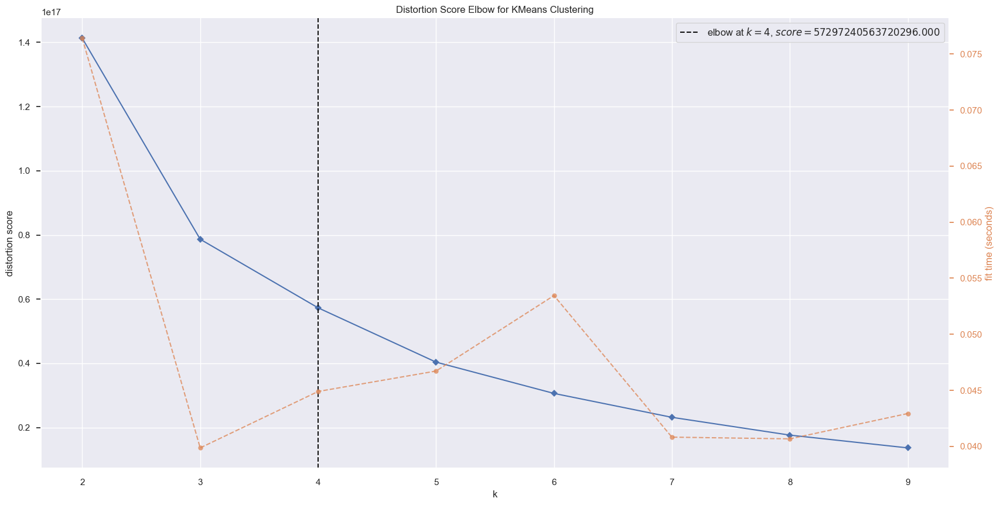

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [207]:
km = KMeans(random_state=42)
visualizer = KElbowVisualizer(km, k=(2,10))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

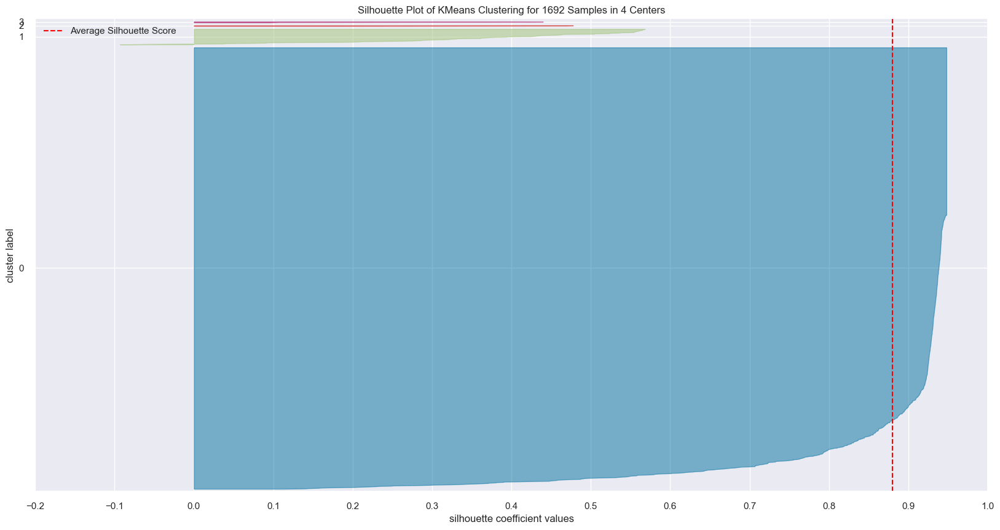

<AxesSubplot: title={'center': 'Silhouette Plot of KMeans Clustering for 1692 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [208]:
# Methode Silhouette
model = KMeans(4, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

Le nombre de clusters préconisé est entre 2 et 4. Le choix sera de 4 clusters.

In [209]:
# Instanciation
kmeans = KMeans(n_clusters=4)

In [210]:
# Fitting
kmeans.fit(X)

KMeans(n_clusters=4)

#### Enregistrement des labels et des centroids

In [211]:
labels = kmeans.labels_

In [212]:
centroids = kmeans.cluster_centers_
centroids

array([[-4.37297927e-02,  3.87764152e+00,  4.77322402e+00,
         2.66856655e+06,  8.73084004e+05,  1.47744552e+01,
        -7.50466745e-03],
       [ 7.20666581e-02,  5.67811400e+00,  6.58753821e+00,
         1.94190308e+08,  6.43264033e+06,  1.94726871e+01,
        -2.21370885e-01],
       [ 3.66029585e-01,  4.49368792e+00,  5.52813523e+00,
         3.58392704e+07,  4.60580416e+06,  1.74802294e+01,
         1.07929915e-01],
       [ 3.89751509e-01,  5.40877425e+00,  6.08565459e+00,
         6.63156468e+07,  8.34068345e+07,  1.87476987e+01,
         1.14556084e-01]])

#### Mise à l'echelle des données et entrainement du modèle

In [213]:
# Scaling
scaler = StandardScaler()

In [214]:
X_scaled = scaler.fit_transform(X)
X_scaled[:10]

array([[ 7.32761036e-01,  7.14021753e-04,  4.18680437e-02,
        -2.15977293e-01, -1.56655054e-01, -8.24261831e-02,
         1.37694562e+00],
       [ 7.33766148e-01,  8.42535062e-01,  6.33538839e-01,
        -2.99589841e-02,  1.44187747e-02,  8.41053185e-01,
         1.51741619e+00],
       [ 2.60321319e+00,  1.08562219e+00,  5.78251125e-01,
        -9.02107405e-02,  8.06281649e-01,  9.79073247e-01,
         3.08458684e+00],
       [ 2.16164162e-01,  1.10620126e+00,  1.07028756e+00,
         3.87562573e+00,  5.89071504e-02,  2.97725895e+00,
         1.49047811e+00],
       [ 1.04385719e+00,  7.14021753e-04,  4.18680437e-02,
        -2.15977293e-01, -1.56655054e-01, -8.24261831e-02,
         1.95755709e+00],
       [ 6.48866305e-01,  1.34095222e+00,  8.96121978e-01,
        -1.30819257e-01,  1.23877860e-01,  7.84005637e-01,
         1.08245544e+00],
       [ 1.44644143e+00,  7.14021753e-04,  4.18680437e-02,
        -2.15977293e-01, -1.56655054e-01, -8.24261831e-02,
         1.7504386

In [215]:
# Entrainment
pca = PCA(n_components=4)
pca.fit(X_scaled)

PCA(n_components=4)

In [216]:
pca.explained_variance_ratio_.cumsum()

array([0.42950456, 0.66198023, 0.80586042, 0.8981766 ])

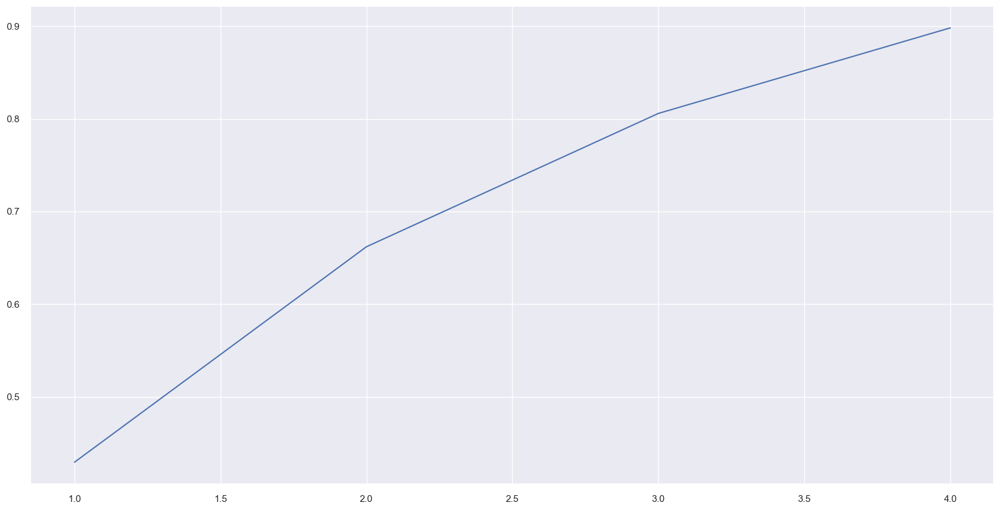

In [217]:
# Représentation de la courbe de cumul des variances
plt.plot(range(1,5), pca.explained_variance_ratio_.cumsum())
plt.xlabel = "n_components"
plt.ylabel = "% of variance"
plt.show()

#### Projection

In [218]:
X_proj = pca.transform(X_scaled)
X_proj[:10]

array([[-6.04924993e-02,  1.45377459e+00, -4.43702558e-01,
        -6.68210626e-02],
       [ 1.26284754e+00,  1.43594432e+00, -7.55028496e-01,
        -1.40393080e-01],
       [ 1.79101145e+00,  3.88886845e+00, -6.30324239e-01,
        -6.64718623e-01],
       [ 4.15145529e+00,  1.04702241e+00,  1.00805376e+00,
         2.73826288e+00],
       [-2.48186173e-02,  2.07717252e+00, -5.33598716e-01,
        -6.81926848e-02],
       [ 1.59619753e+00,  1.01497193e+00, -9.51088944e-01,
        -4.20293485e-01],
       [-3.25434433e-03,  2.21246480e+00, -5.44518660e-01,
        -3.49127969e-02],
       [-5.75088101e-03,  2.38617518e+00, -5.77297226e-01,
        -6.55078289e-02],
       [ 2.55085990e+00,  2.84582292e+00, -8.85817187e-02,
        -1.06236985e+00],
       [-8.33135462e-02,  1.31380778e+00, -4.32723307e-01,
        -1.02493862e-01]])

In [219]:
X_proj = pd.DataFrame(X_proj, columns = ["F1", "F2", "F3","F4"])
X_proj[:10]

,F1,F2,F3,F4
0,-0.06049,1.45377,-0.44370,-0.06682
1,1.26285,1.43594,-0.75503,-0.14039
2,1.79101,3.88887,-0.63032,-0.66472
3,4.15146,1.04702,1.00805,2.73826
4,-0.02482,2.07717,-0.53360,-0.06819
5,1.59620,1.01497,-0.95109,-0.42029
6,-0.00325,2.21246,-0.54452,-0.03491
7,-0.00575,2.38618,-0.57730,-0.06551
8,2.55086,2.84582,-0.08858,-1.06237
9,-0.08331,1.31381,-0.43272,-0.10249


In [220]:
centroids_scaled = scaler.fit_transform(centroids)
centroids_scaled

array([[-1.28487757, -1.37203851, -1.43971062, -0.99375672, -0.66627021,
        -1.5887281 , -0.04348317],
       [-0.66432073,  1.13103706,  1.25201417,  1.64654752, -0.50491436,
         1.03553114, -1.61774118],
       [ 0.91103588, -0.51559072, -0.31972092, -0.53646791, -0.5579349 ,
        -0.07738234,  0.80622473],
       [ 1.03816242,  0.75659216,  0.50741736, -0.11632289,  1.72911947,
         0.6305793 ,  0.85499962]])

In [221]:
centroids_proj = pca.transform(centroids_scaled)
centroids_proj = pd.DataFrame(centroids_proj,
                              columns = ["F1", "F2", "F3","F4"],
                              index=["cluster_0", "cluster_1", "cluster_2", "cluster_3"])
centroids_proj

,F1,F2,F3,F4
cluster_0,-2.88516,-0.73468,0.17415,-0.14289
cluster_1,2.13110,-1.83358,-0.16899,1.27034
cluster_2,-0.73704,1.21320,-0.50700,0.16817
cluster_3,1.49110,1.35506,0.50184,-1.29563


#### Visualisation

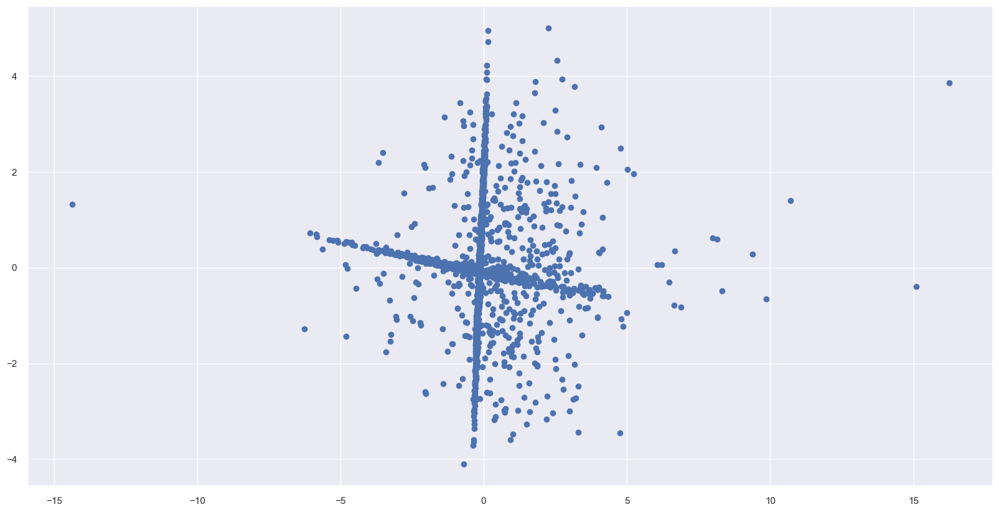

In [222]:
plt.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1]);

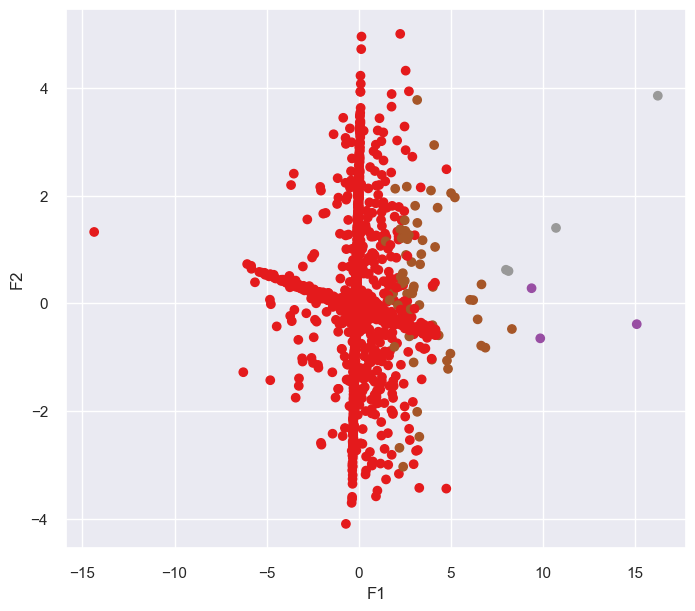

In [223]:
fig, ax = plt.subplots(1,1, figsize=(8,7))

ax.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1], c= labels, cmap="Set1")

ax.set_xlabel("F1")
ax.set_ylabel("F2");

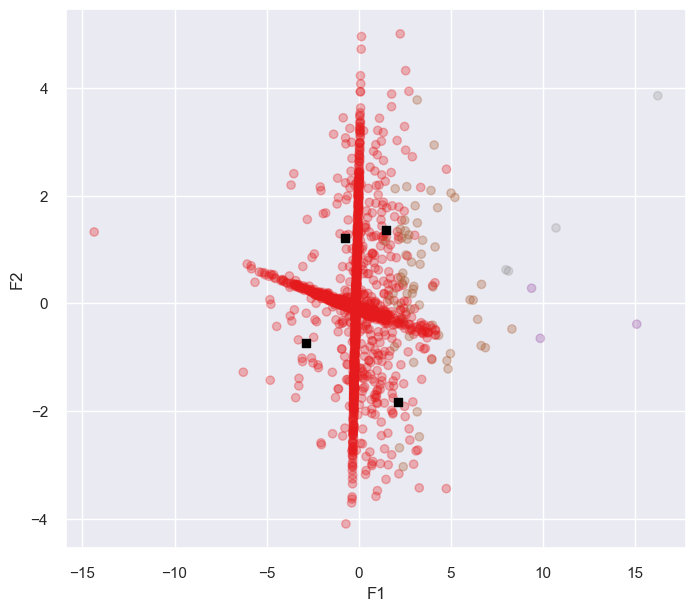

In [224]:

fig, ax = plt.subplots(1, 1, figsize=(8, 7))

ax.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1], c=labels, cmap="Set1", alpha=0.3)
ax.scatter(centroids_proj.iloc[:, 0], centroids_proj.iloc[:, 1], marker="s", c="black")

ax.set_xlabel("F1")
ax.set_ylabel("F2");

In [225]:
fig = px.scatter_3d(x=X_proj.iloc[:,0], y=X_proj.iloc[:,1], z=X_proj.iloc[:, 2],
                    color=labels)
fig.show()

### PCA

#### Préparation du jeu de données

In [226]:
data_pca = data_clean[['PropertyGFABuildings', 'SiteEUI_kBtu_sfLog', 'SourceEUI_kBtu_sfLog', 'Electricity_kBtu', 'NaturalGas_kBtu', 'SiteEnergyUseLog','TotalGHGEmissions']]

In [227]:
data_pca

,PropertyGFABuildings,SiteEUI_kBtu_sfLog,SourceEUI_kBtu_sfLog,Electricity_kBtu,NaturalGas_kBtu,SiteEnergyUseLog,TotalGHGEmissions
0,0.55599,3.90600,4.83230,1775076.0,440675.5,14.79591,1.09341
1,0.55680,4.41522,5.21221,3946027.0,1276453.0,15.79325,1.20533
2,2.04786,4.56226,5.17671,3242851.0,5145082.0,15.94230,2.45394
3,0.14396,4.57471,5.49265,49526664.0,1493800.0,18.10030,1.18387
4,0.80412,3.90600,4.83230,1775076.0,440675.5,14.79591,1.55600
...,...,...,...,...,...,...,...
50045,-0.07790,3.73529,4.75014,11733018.0,2265619.0,16.45447,-0.00996
50062,-0.07790,4.24133,5.13874,4115620.0,1926779.0,15.61431,-0.00996
50068,-0.07790,4.25135,4.63570,732803.0,2873052.0,15.09807,-0.00996
50069,-0.07790,5.18122,5.90808,2167029.0,2253621.0,15.30180,-0.00996


In [228]:
data_pca_label = data[["PrimaryPropertyType"]]

#### Data split

##### Séparation des données

In [229]:
#Création de la variable contenant les colonnes
features = data_pca.columns

In [230]:
#Création de X la matrice de données
X = data_pca
keep_ind = X.index
X[:9]

,PropertyGFABuildings,SiteEUI_kBtu_sfLog,SourceEUI_kBtu_sfLog,Electricity_kBtu,NaturalGas_kBtu,SiteEnergyUseLog,TotalGHGEmissions
0,0.55599,3.90600,4.83230,1775076.0,440675.5,14.79591,1.09341
1,0.55680,4.41522,5.21221,3946027.0,1276453.0,15.79325,1.20533
2,2.04786,4.56226,5.17671,3242851.0,5145082.0,15.94230,2.45394
3,0.14396,4.57471,5.49265,49526664.0,1493800.0,18.10030,1.18387
4,0.80412,3.90600,4.83230,1775076.0,440675.5,14.79591,1.55600
5,0.48908,4.71671,5.38082,2768924.0,1811213.0,15.73164,0.85878
6,1.12522,3.90600,4.83230,1775076.0,440675.5,14.79591,1.39098
7,0.95389,3.90600,4.83230,1775076.0,440675.5,14.79591,1.75870
8,1.49562,4.75186,5.35847,5368607.0,8803998.0,16.46682,1.80322


In [231]:
X = np.nan_to_num(X)

In [232]:
X.shape

(1692, 7)

#### Scaling

In [233]:
#Scalling des données
scaller = StandardScaler()

In [234]:
# Fit et transformation des données
scaller.fit(X)
X_scaled = scaller.transform(X)
X_scaled[:5]

array([[ 7.32761036e-01,  7.14021753e-04,  4.18680437e-02,
        -2.15977293e-01, -1.56655054e-01, -8.24261831e-02,
         1.37694562e+00],
       [ 7.33766148e-01,  8.42535062e-01,  6.33538839e-01,
        -2.99589841e-02,  1.44187747e-02,  8.41053185e-01,
         1.51741619e+00],
       [ 2.60321319e+00,  1.08562219e+00,  5.78251125e-01,
        -9.02107405e-02,  8.06281649e-01,  9.79073247e-01,
         3.08458684e+00],
       [ 2.16164162e-01,  1.10620126e+00,  1.07028756e+00,
         3.87562573e+00,  5.89071504e-02,  2.97725895e+00,
         1.49047811e+00],
       [ 1.04385719e+00,  7.14021753e-04,  4.18680437e-02,
        -2.15977293e-01, -1.56655054e-01, -8.24261831e-02,
         1.95755709e+00]])

In [235]:
#Verification de la moyennes et de l'écart-type
idx = ["mean", "std"]

pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]

,0,1,2,3,4,5,6
mean,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0


La moyenne attendu est de 0 et l'écart-type attendu est de 1

In [236]:
#Travail sur les 6 composants
n_components = 6

In [237]:
#Instanciation du PCA
pca = PCA(n_components=n_components)

In [238]:
#Entrainement du PCA sur les données scalées
pca.fit(X_scaled)

PCA(n_components=6)

In [239]:
pca.explained_variance_ratio_

array([0.42950456, 0.23247567, 0.14388018, 0.09231619, 0.05381322,
       0.03734603])

In [240]:
#Enregistrement des variances
scree = (pca.explained_variance_ratio_*100).round(2)

In [241]:
#Cumul des variances
scree_cum = scree.cumsum().round()
scree_cum

array([43., 66., 81., 90., 95., 99.])

In [242]:
#Variable des composants
x_list = range(1, n_components+1)
list (x_list)

[1, 2, 3, 4, 5, 6]

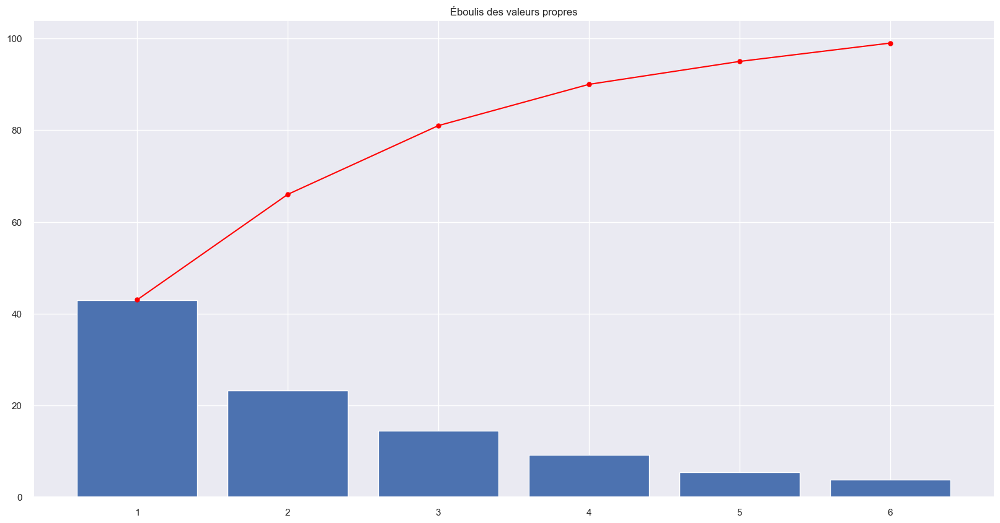

In [243]:
#Visualisation des éboulis et pourcentage d'inertie
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
#plt.xlabel("rang de l\'axe d\'inertie")
#plt.ylabel("pourcentage d\'inertie")
plt.title("Éboulis des valeurs propres")
plt.show(block=False)

En bleu la variance de chaque nouvelle composante, et en rouge la variance cumulée.
80% de la variance est comprise dans les 3 premières composantes, et près de 90% dans les 4 premières.

#### Composants

In [244]:
#Array de Calcul des composantes
pcs = pca.components_
pcs

array([[ 0.06676928,  0.510827  ,  0.50416318,  0.37347618,  0.27577219,
         0.51402685,  0.02566641],
       [ 0.69645957, -0.07998509, -0.09769668,  0.01904751,  0.08819425,
        -0.01129072,  0.70052359],
       [-0.08370615, -0.34960568, -0.38680511,  0.48717491,  0.68649752,
         0.02090855, -0.10997974],
       [ 0.0638496 , -0.21847017, -0.11430324,  0.67977015, -0.66173676,
         0.18386997, -0.03657349],
       [-0.70323446,  0.01557484,  0.01513359,  0.09637667, -0.02411659,
        -0.03116077,  0.70295706],
       [ 0.06968947,  0.21988699,  0.31255583,  0.38438067,  0.04444009,
        -0.83574648, -0.03010546]])

In [245]:
#DF de calcul des composantes
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6
0,0.06677,0.51083,0.50416,0.37348,0.27577,0.51403,0.02567
1,0.69646,-0.07999,-0.09770,0.01905,0.08819,-0.01129,0.70052
2,-0.08371,-0.34961,-0.38681,0.48717,0.68650,0.02091,-0.10998
3,0.06385,-0.21847,-0.11430,0.67977,-0.66174,0.18387,-0.03657
4,-0.70323,0.01557,0.01513,0.09638,-0.02412,-0.03116,0.70296
5,0.06969,0.21989,0.31256,0.38438,0.04444,-0.83575,-0.03011


In [246]:
features

Index(['PropertyGFABuildings', 'SiteEUI_kBtu_sfLog', 'SourceEUI_kBtu_sfLog',
       'Electricity_kBtu', 'NaturalGas_kBtu', 'SiteEnergyUseLog',
       'TotalGHGEmissions'],
      dtype='object')

In [247]:
#Calcul des composantes : arrondis
pcs.columns = features
pcs.index = [f"F{i}" for i in x_list]
pcs.round(2)

,PropertyGFABuildings,SiteEUI_kBtu_sfLog,SourceEUI_kBtu_sfLog,Electricity_kBtu,NaturalGas_kBtu,SiteEnergyUseLog,TotalGHGEmissions
F1,0.07,0.51,0.50,0.37,0.28,0.51,0.03
F2,0.70,-0.08,-0.10,0.02,0.09,-0.01,0.70
F3,-0.08,-0.35,-0.39,0.49,0.69,0.02,-0.11
F4,0.06,-0.22,-0.11,0.68,-0.66,0.18,-0.04
F5,-0.70,0.02,0.02,0.10,-0.02,-0.03,0.70
F6,0.07,0.22,0.31,0.38,0.04,-0.84,-0.03


In [248]:
#Transposition du df
pcs.T

,F1,F2,F3,F4,F5,F6
PropertyGFABuildings,0.06677,0.69646,-0.08371,0.06385,-0.70323,0.06969
SiteEUI_kBtu_sfLog,0.51083,-0.07999,-0.34961,-0.21847,0.01557,0.21989
SourceEUI_kBtu_sfLog,0.50416,-0.09770,-0.38681,-0.11430,0.01513,0.31256
Electricity_kBtu,0.37348,0.01905,0.48717,0.67977,0.09638,0.38438
NaturalGas_kBtu,0.27577,0.08819,0.68650,-0.66174,-0.02412,0.04444
SiteEnergyUseLog,0.51403,-0.01129,0.02091,0.18387,-0.03116,-0.83575
TotalGHGEmissions,0.02567,0.70052,-0.10998,-0.03657,0.70296,-0.03011


<AxesSubplot: >

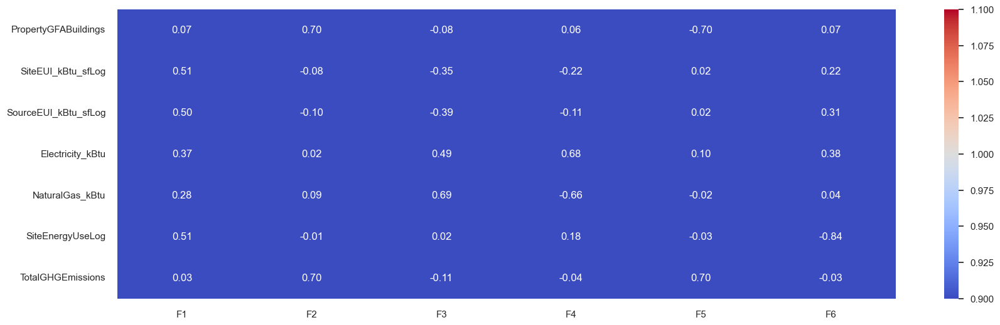

In [249]:
# Representation visuelle des composantes
fig, ax = plt.subplots(figsize=(20,6))
sns.heatmap(pcs.T, vmin=1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

In [250]:
#### Tracé des cercles de corrélation

In [251]:
x_y = (0,1)
x_y

(0, 1)

In [252]:
pca.explained_variance_ratio_

array([0.42950456, 0.23247567, 0.14388018, 0.09231619, 0.05381322,
       0.03734603])

In [253]:
# Fonction pour l'affichage du graphique de correlation PCA
def correlation_graph(pca,
                      x_y,
                      features) :
    """Affiche le graphe des correlations

    Positional arguments :
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante :
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0,
                 pca.components_[x, i],
                 pca.components_[y, i],
                 head_width=0.07,
                 head_length=0.07,
                 width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                 pca.components_[y, i] + 0.05,
                 features[i])

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    # plt.xlabel("F{} ({}%)".format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    # plt.ylabel("F{} ({}%)".format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    #Affichage du titre du graphique
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

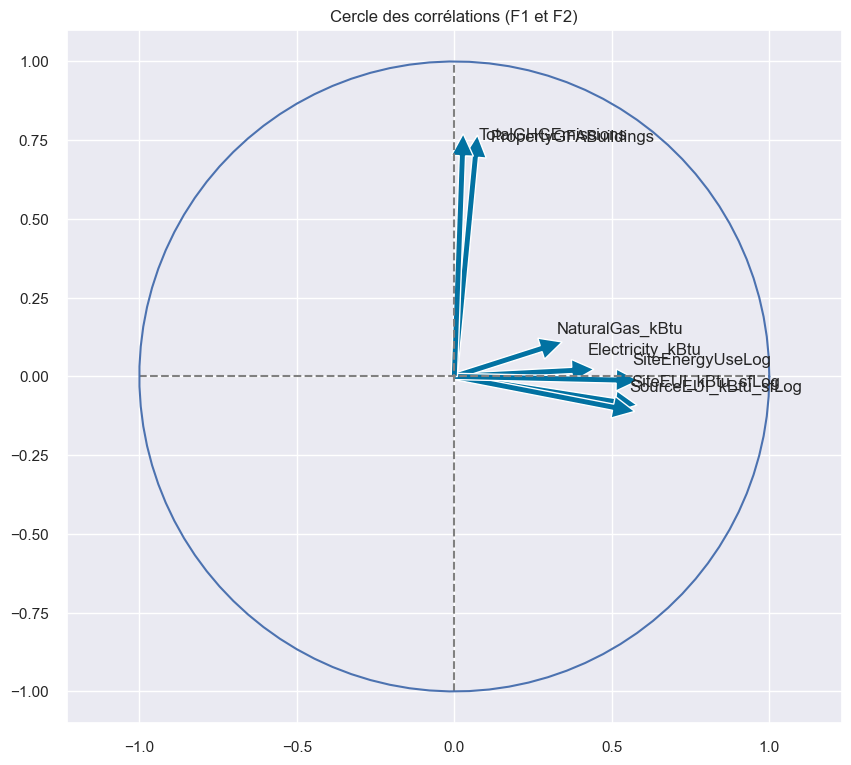

In [254]:
correlation_graph(pca, (0,1), features)

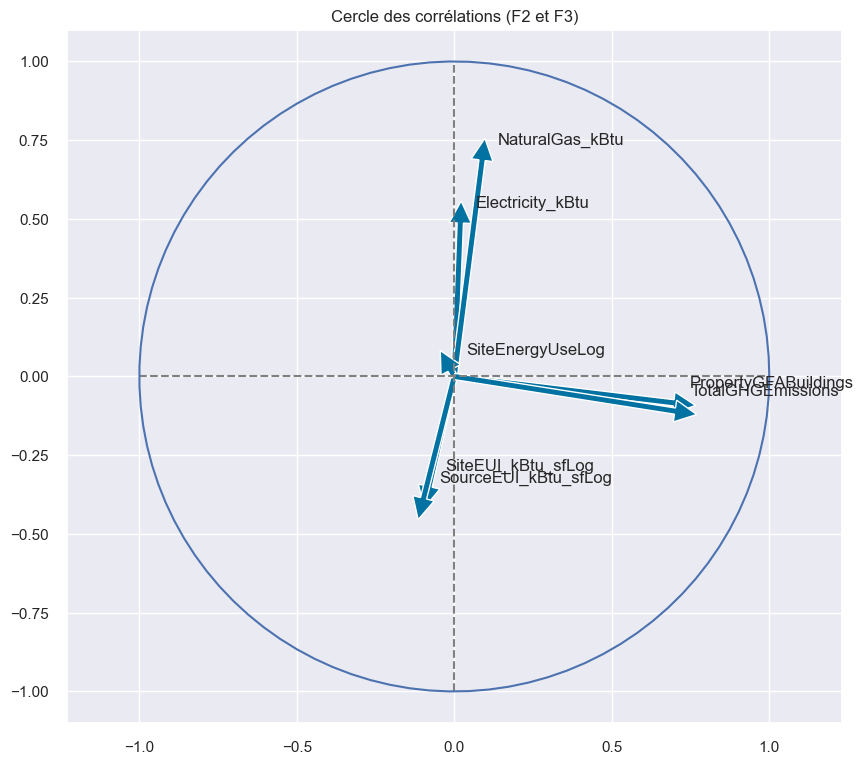

In [255]:
correlation_graph(pca, (1,2), features)

Sur le cercle des corrélation F1 (42,95 %) et F2 (23,24 %) :

‘SiteEUI_kBtu_sfLog’ ‘SourceEUI_kBtu_sfLog’ et ‘SiteEnergyUsesfLog’ sont corrélés à respectivement 51%, 51% et 50% sur l’axe F1 mais à -8%, -10%, et -1% sur l’axe F2.
‘NaturalGas_kBtu’ et ‘Electricity_Kbtu’ sont corrélés à F1 à 28 % et 37 %
'PropertyGFABuildings' et 'TotalGHGEmissions' sont corrélés sur l'axe à 70% sur l'axe F2 mais à 7 et 3 % sur l'axe F1
l'axe F1 représente les sources d'énergies et la consommation énergétique en corrélation. L'axe F2 en corrélation représente la superficie des bâtiments et les émissions en gaz à effet de serre.

Sur le cercle des corrélation F3 (14,28 %) et F4 (9,23 %) :
'Electricity_kBtu' et ‘NaturalGas_kBtu’ sont corrélés en F3 à 49 % et 69% et faiblement présent en F2
'PropertyGFABuildings' et 'TotalGHGEmissions' sont corrélés en F2 à 70% et faiblement en F3 à -8 % et -11 %
‘SiteEUI_kBtu_sfLog’ ‘SourceEUI_kBtu_sfLog’ sont anticorrélés à respectivement 35% et 39% l’axe F3 mais à -8%, -10% sur l’axe F2.

Nous avons sur l'axe F2 les source d'énergie en corrélation, la surface et les émissions de gaz a effet de serre en F3
L'axe F2 en anticorrélation représente la consommation d'énergie.

Nous pouvons observer 3 grands groupes de features. Le groupe consommation énergétiques, le groupe de surface et emission de gaz et le groupe du type d'énergie.



In [256]:
X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[-6.04924993e-02,  1.45377459e+00, -4.43702558e-01,
        -6.68210626e-02,  4.38806847e-01,  1.76338672e-03],
       [ 1.26284754e+00,  1.43594432e+00, -7.55028496e-01,
        -1.40393080e-01,  5.43935897e-01, -3.25050102e-01],
       [ 1.79101145e+00,  3.88886845e+00, -6.30324239e-01,
        -6.64718623e-01,  3.04674624e-01, -3.09097452e-01],
       [ 4.15145529e+00,  1.04702241e+00,  1.00805376e+00,
         2.73826288e+00,  1.20847977e+00, -4.47943533e-01],
       [-2.48186173e-02,  2.07717252e+00, -5.33598716e-01,
        -6.81926848e-02,  6.28178244e-01,  5.96393841e-03]])

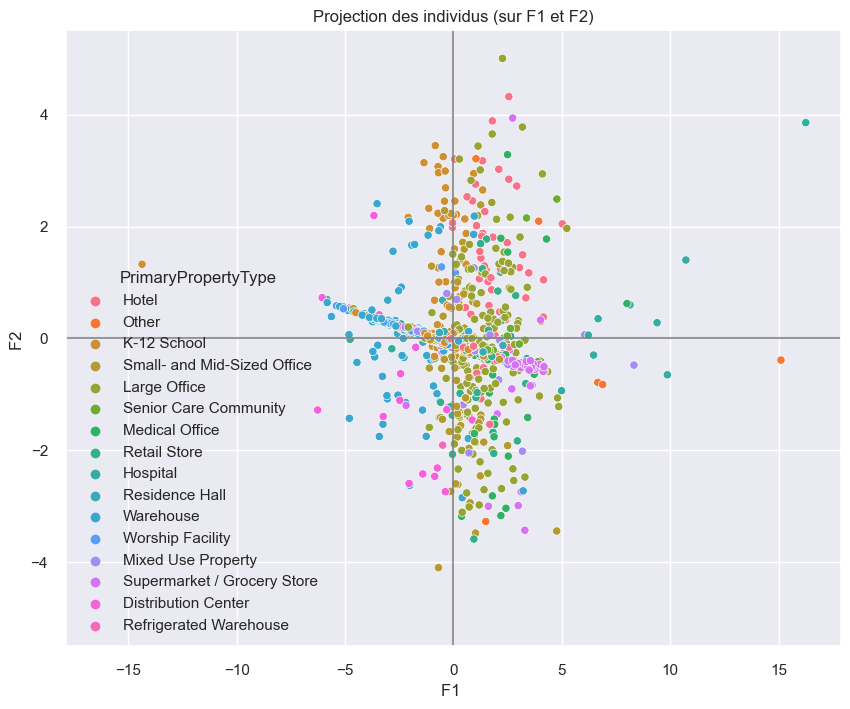

In [257]:
x_y = [0,1]
moduleexplo.display_factorial_planes(X_proj, x_y, clusters=data_clean["PrimaryPropertyType"])

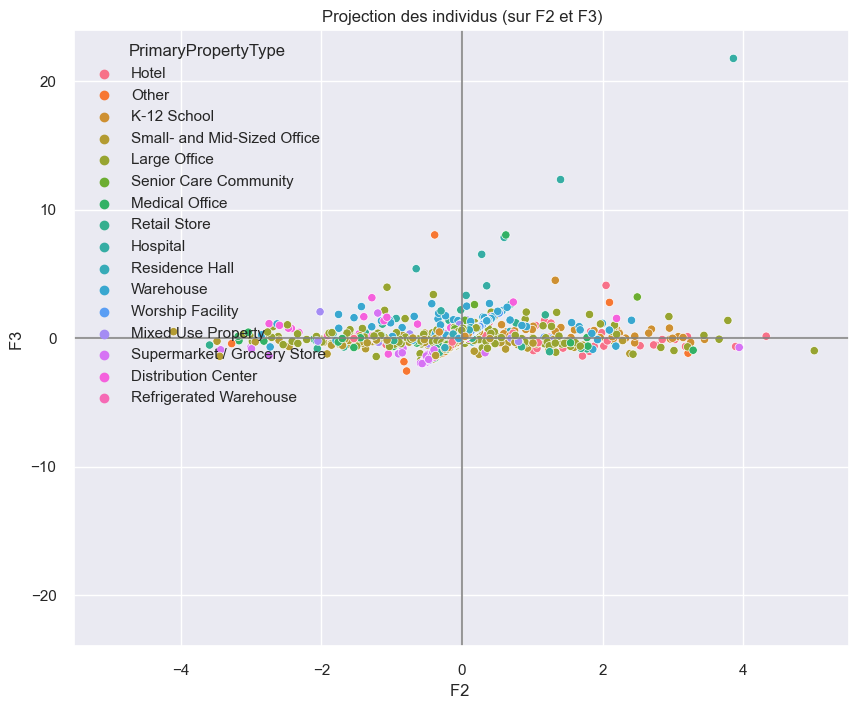

In [258]:
x_y = [1,2]
moduleexplo.display_factorial_planes(X_proj, x_y, clusters=data_clean["PrimaryPropertyType"])

In [259]:
data_clean.sort_values('SiteEnergyUse_kBtu', ascending=False)

,PropertyGFABuildings,LargestPropertyUseTypeGFA,SteamUse_kBtu,Electricity_kBtu,NaturalGas_kBtu,TotalGHGEmissions,GHGEmissionsIntensity,YearBuilt,SiteEnergyUse_kBtu,ENERGYSTARScore,NumberofFloors,NumberofBuildings,Longitude,Latitude,Neighborhood,Address,PropertyName,PrimaryPropertyType,SiteEnergyUseLog,SourceEUI_kBtu_sfLog,SiteEUI_kBtu_sfLog
105,2.21580,2.26328,0.0,1775076.0,440675.5,3.42974,2.08077,1.22914,3.83859,73.0,3.0,1.0,-122.33328,47.61242,NaN,NaN,NaN,NaN,14.79591,4.83230,3.90600
443,2.35674,2.32526,0.0,16373229.0,0.0,3.50848,1.94950,0.98785,3.83376,77.0,5.0,1.0,-122.36158,47.62177,MAGNOLIA / QUEEN ANNE,300 Elliott Avenue West,Elliott Bay Office Park,Large Office,16.61116,5.42053,4.28634
398,1.76995,1.36986,0.0,15974366.0,2127656.0,2.40244,1.68522,0.49677,3.77658,90.0,6.0,1.0,-122.35263,47.61429,DOWNTOWN,2601 Elliott Avenue,2601 Elliott Avenue,Large Office,16.71153,5.04471,3.99452
78,2.10931,2.10756,0.0,1775076.0,440675.5,3.26951,2.08121,-0.42700,3.70141,73.0,3.0,1.0,-122.33328,47.61242,NaN,NaN,NaN,NaN,14.79591,4.83230,3.90600
1060,1.69300,2.16100,0.0,1775076.0,440675.5,3.12168,2.27852,-1.31382,3.29082,73.0,3.0,1.0,-122.33328,47.61242,NaN,NaN,NaN,NaN,14.79591,4.83230,3.90600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,-1.40446,-1.26994,0.0,8488392.0,167210.0,-1.97484,-1.47723,0.35399,-2.30580,88.0,7.0,1.0,-122.35915,47.62225,MAGNOLIA / QUEEN ANNE,400 Second Avenue,West Tower,Large Office,15.97372,5.10897,3.99083
975,-1.57447,-1.43247,0.0,1775076.0,440675.5,-2.58124,-1.77636,-0.39691,-2.35426,73.0,3.0,1.0,-122.33328,47.61242,NaN,NaN,NaN,NaN,14.79591,4.83230,3.90600
716,-1.25856,-1.13042,0.0,2235899.0,1006018.0,-2.59545,-1.81696,0.14683,-2.37789,89.0,6.0,1.0,-122.33602,47.60223,DOWNTOWN,619 Western Avenue,Western Building,Retail Store,14.99168,6.39326,3.79549
1005,-1.31476,-1.18417,0.0,1775076.0,440675.5,-2.51811,-1.77636,-1.31382,-2.52393,73.0,3.0,1.0,-122.33328,47.61242,NaN,NaN,NaN,NaN,14.79591,4.83230,3.90600


## Création des fichiers de sauvegarde

In [260]:
data = data.dropna()

Le nombre de lignes du fichier est de  1074 et de son nombre de colonnes est de 18


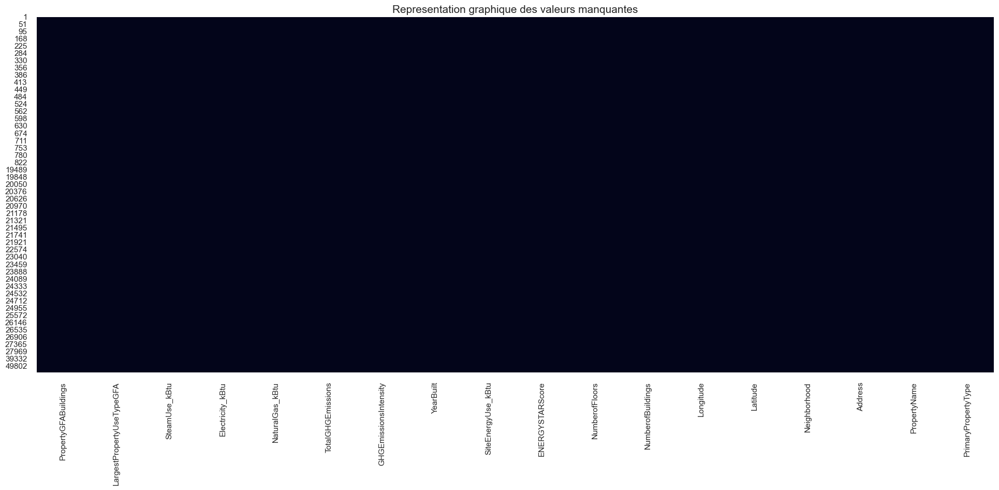

In [261]:
# Vérification des données manquantes
moduleexplo.valeurs(data)

In [262]:
data.to_csv('/Users/xparisot/Formation OpenClassRoom/Projets/Projet 4/fr_data.csv', index=False)

In [263]:
data_clean.to_csv('/Users/xparisot/Formation OpenClassRoom/Projets/Projet 4/fr_data_clean.csv', index=False)